In [3]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm, multivariate_normal
from scipy.optimize import fsolve

# --------------------
# Bước 1: Dữ liệu giả lập giá trái phiếu
# --------------------
prices = np.array([
    [98.5, 97.0, 95.5],
    [97.8, 96.5, 94.8],
    [99.0, 98.2, 96.0],
    [96.5, 95.8, 94.2],
    [98.0, 97.5, 95.8],
    [97.2, 96.0, 94.0],
    [99.5, 98.8, 96.5],
    [96.8, 95.5, 94.5],
    [98.3, 97.2, 95.2],
    [97.0, 96.8, 94.7]
])

par_value = 100
coupon = 5
maturity = 5
risk_free = 0.02
LGD = 0.4  # Loss given default

# --------------------
# Bước 2: Tính YTM & hazard rate
# --------------------
def calculate_ytm(price, coupon, par_value, maturity):
    def bond_price(y, coupon, par_value, maturity):
        return sum(coupon / (1 + y)**t for t in range(1, maturity + 1)) + par_value / (1 + y)**maturity
    def objective(y, price, coupon, par_value, maturity):
        return bond_price(y, coupon, par_value, maturity) - price
    ytm = fsolve(objective, 0.05, args=(np.mean(price), coupon, par_value, maturity))[0]
    return ytm

hazard_rates = []
for i in range(3):
    ytm = calculate_ytm(prices[:, i], coupon, par_value, maturity)
    credit_spread = ytm - risk_free
    lambda_i = credit_spread / LGD  # Hazard rate
    hazard_rates.append(lambda_i)

hazard_rates = np.array(hazard_rates)
print("Hazard Rates:", hazard_rates.round(4))

# --------------------
# Bước 3: Tính marginal default probs (2 năm)
# --------------------
t_horizon = 2.0
p = np.array([1 - np.exp(-lambda_i * t_horizon) for lambda_i in hazard_rates])
print("Marginal Default Probabilities:", p.round(4))

# --------------------
# Bước 4: Fit Gaussian Copula correlation từ dữ liệu
# --------------------
u = np.array([1 - np.exp(-lambda_i * t_horizon) for lambda_i in hazard_rates]).T
u = np.tile(u, (prices.shape[0], 1))  # giả định biên ổn định theo thời gian
z = norm.ppf(u + 1e-6)
Sigma_hat = np.corrcoef(z.T)
print("Estimated Correlation Matrix:\n", np.round(Sigma_hat, 3))

# --------------------
# Bước 5: Monte Carlo mô phỏng copula
# --------------------
n_sim = 20000
mv_norm = multivariate_normal(mean=np.zeros(3), cov=Sigma_hat)
z_sim = mv_norm.rvs(n_sim)
u_sim = norm.cdf(z_sim)

# joint default: tất cả u_i <= p_i
joint_default = np.all(u_sim <= p, axis=1)
joint_prob = np.mean(joint_default)
print(f"Joint Default Probability (t={t_horizon}y): {joint_prob:.6f}")

# --------------------
# Bước 6: Visualization
# --------------------
plt.style.use("seaborn-v0_8-darkgrid")
fig, axes = plt.subplots(2, 2, figsize=(12, 9))

# (1) Price dynamics
axes[0,0].plot(prices, marker="o")
axes[0,0].set_title("Bond Price Dynamics")
axes[0,0].set_xlabel("Time index")
axes[0,0].set_ylabel("Price")
axes[0,0].legend(["Bond A", "Bond B", "Bond C"])

# (2) Correlation heatmap
im = axes[0,1].imshow(Sigma_hat, cmap="RdBu", vmin=-1, vmax=1)
axes[0,1].set_title("Estimated Correlation (Σ̂)")
axes[0,1].set_xticks(range(3))
axes[0,1].set_yticks(range(3))
axes[0,1].set_xticklabels(["A", "B", "C"])
axes[0,1].set_yticklabels(["A", "B", "C"])
for i in range(3):
    for j in range(3):
        axes[0,1].text(j, i, f"{Sigma_hat[i,j]:.2f}", ha="center", va="center", color="black")
fig.colorbar(im, ax=axes[0,1], fraction=0.046, pad=0.04)

# (3) Scatter of latent normals (Z-space)
axes[1,0].scatter(z_sim[:,0], z_sim[:,1], s=5, alpha=0.3, c='blue')
axes[1,0].set_title("Copula Latent Variables (Z-space)")
axes[1,0].set_xlabel("Z₁ (Bond A)")
axes[1,0].set_ylabel("Z₂ (Bond B)")

# (4) Marginal vs joint default
width = 0.25
x = np.arange(3)
axes[1,1].bar(x, p, width, label="Marginal PD", color="steelblue")
axes[1,1].bar(1.5, joint_prob, width, label="Joint PD (all 3)", color="darkred")
axes[1,1].set_xticks([0,1,2,1.5])
axes[1,1].set_xticklabels(["A", "B", "C", "All"])
axes[1,1].set_ylabel("Probability")
axes[1,1].set_title("Default Probabilities Comparison")
axes[1,1].legend()

plt.suptitle("Gaussian Copula Joint Default Illustration", fontsize=14, fontweight="bold")
plt.tight_layout(rect=[0,0,1,0.96])
plt.show()


Hazard Rates: [0.0875 0.0931 0.1041]
Marginal Default Probabilities: [0.1606 0.1699 0.1879]
Estimated Correlation Matrix:
 [[ 1. nan nan]
 [nan nan nan]
 [nan nan nan]]


ValueError: array must not contain infs or NaNs

In [4]:
import numpy as np
from scipy.stats import norm, multivariate_normal
from numpy.linalg import eigh

# ---- helpers ----
def clamp01(a, eps=1e-9):
    return np.clip(a, eps, 1 - eps)

def ensure_psd(corr, eps=1e-10):
    # eigen clip to make PSD, then rescale to unit diag
    corr = (corr + corr.T) / 2.0
    vals, vecs = eigh(corr)
    vals = np.clip(vals, eps, None)
    A = (vecs * vals) @ vecs.T
    d = np.sqrt(np.diag(A))
    corr_psd = A / np.outer(d, d)
    return corr_psd

# ---- 1) Marginal PD từ hazard (như trước) ----
t_horizon = 2.0
p = np.array([1 - np.exp(-lambda_i * t_horizon) for lambda_i in hazard_rates])
p = clamp01(p, 1e-9)  # tránh 0/1

# ---- 2) Copula correlation từ dữ liệu giá (returns → rank → z) ----
# log-returns theo cột (mỗi trái phiếu là 1 cột)
ret = np.diff(np.log(prices), axis=0)  # shape (T-1, 3)

# rank-transform mỗi cột thành uniform (Empirical CDF)
# chú ý: +1 để tránh 0 và chia bởi (n+1) để tránh 1
ranks = np.argsort(np.argsort(ret, axis=0), axis=0) + 1
u_ret = ranks / (ret.shape[0] + 1.0)
u_ret = clamp01(u_ret, 1e-6)          # an toàn

# Gaussianize: z ~ N(0,1)
z_ret = norm.ppf(u_ret)

# Tương quan Gaussian-copula ước lượng từ z_ret
Sigma_hat = np.corrcoef(z_ret.T)

# PSD & ridge nhỏ nếu vẫn gần suy biến
Sigma_hat = ensure_psd(Sigma_hat, eps=1e-10)
Sigma_hat = 0.9999 * Sigma_hat + 0.0001 * np.eye(Sigma_hat.shape[0])  # ridge nhẹ

# ---- 3) Mô phỏng Gaussian copula ----
n_sim = 20000
mv_norm = multivariate_normal(mean=np.zeros(3), cov=Sigma_hat, allow_singular=True)
z_sim = mv_norm.rvs(n_sim)
u_sim = norm.cdf(z_sim)

# joint default: tất cả u_i <= p_i
joint_default = np.all(u_sim <= p, axis=1)
joint_prob = np.mean(joint_default)
print("Copula correlation (from returns):\n", np.round(Sigma_hat, 3))
print(f"Marginal PDs (t={t_horizon}y):", np.round(p, 6))
print(f"Joint Default Probability: {joint_prob:.6f}")


Copula correlation (from returns):
 [[1.    0.943 0.913]
 [0.943 1.    0.933]
 [0.913 0.933 1.   ]]
Marginal PDs (t=2.0y): [0.160591 0.169865 0.187941]
Joint Default Probability: 0.114550


In [ ]:
from vnquants import *
from vnfunds import *
sns.set_theme(style="whitegrid", palette="muted")
delete_cache(".")

# 1. Alpha Reasearch

## 1.1. Alpha Factory

The Alpha Factory is a structured process for generating and implementing investment signals, as shown in Figure 1. This process ensures that investment decisions are based on rigorous quantitative analysis and align with the platform’s objectives of maximizing returns while minimizing risk.

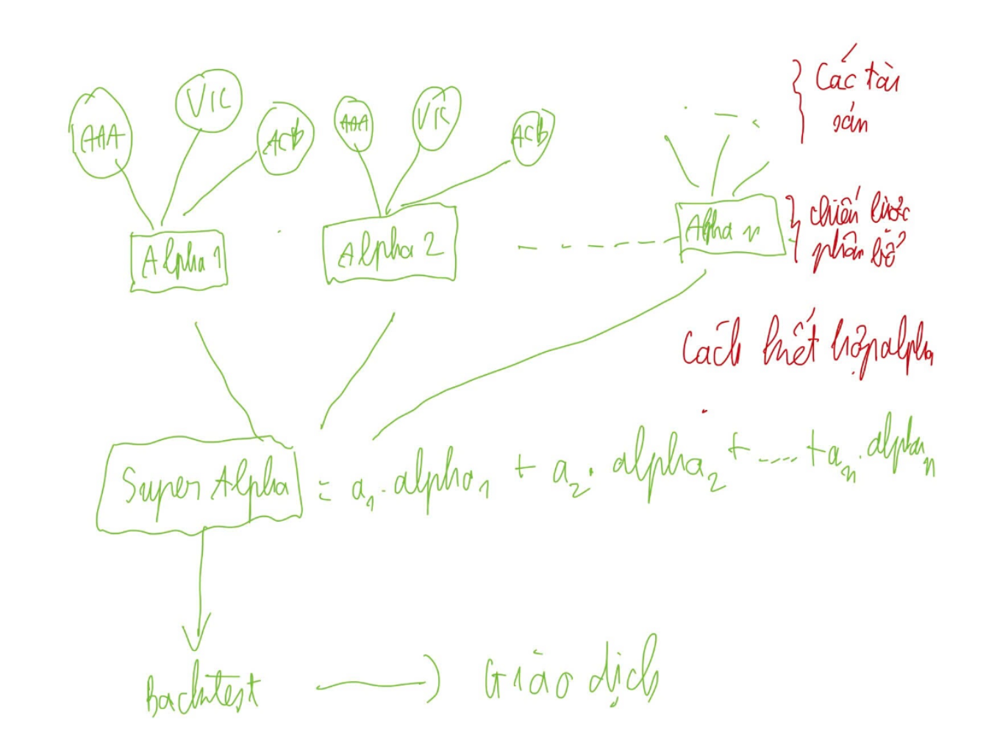

Figure 1. Overview of Alpha Factory.

## 1.2. Liquidity Asset Selection

The first stage of the Alpha Factory involves the careful selection of liquid assets, specifically stocks, for portfolio construction.
The selection criteria prioritize assets with high liquidity to minimize liquidity risk and reduce transaction costs, such as bid-ask spreads.
Highly liquid assets are typically associated with strong market participation, ensuring stability and reliability in portfolio construction.

Quantitative metrics such as trading volume and market capitalization are used to identify assets that meet predefined liquidity thresholds.

## 1.3. Regular Alpha

### 1.3.1. Alpha Space

At the core of the Alpha Factory is the generation of Regular Alphas, which represent individual investment perspectives or hypotheses about asset performance.
These alphas are developed in an open and flexible environment, where diverse investment ideas can be explored independently.

Each alpha represents a unique perspective, and the collection of alphas forms a multidimensional idea space, analogous to an infinite-dimensional vector space.

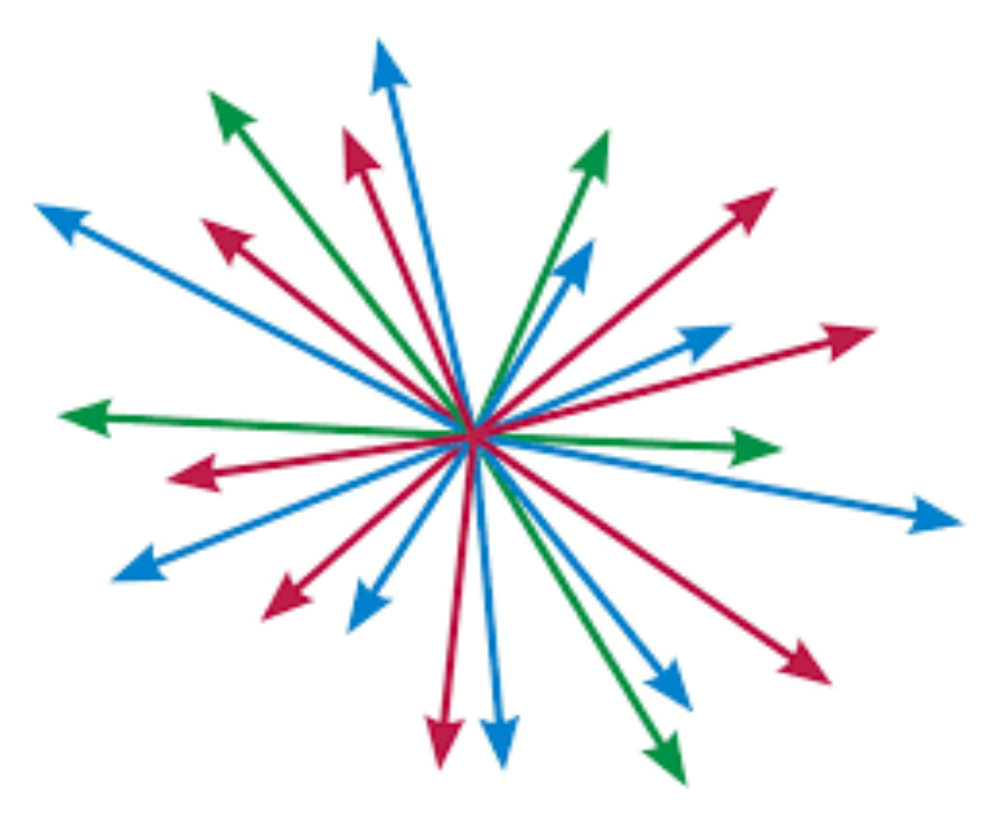

Figure 2. Conceptual Illustration of the Multidimensional Alpha Idea Space.

An alpha represents the weight allocated to each asset in the portfolio based on predictive trading signals.
To ensure that the portfolio adheres to the fully invested constraint, alpha signals are normalized so that the sum of the absolute weights equals one:

$$
\text{weight}_{i,t} = \frac{\alpha_{i,t}}{\sum_{i=0}^N |\alpha_{i,t}|}
$$
$$
\sum_{i=0}^N |\text{weight}_{i,t}| = 1
$$

Where:
- $i$: index representing the i-th stock in the portfolio
- $t$: time of the investment decision
- $N$: total number of stocks in the portfolio
- $\alpha_{i,t}$: alpha signal for stock i at time t
- $\text{weight}_{i,t}$ : normalized weight of stock i at time t

This normalization ensures that the portfolio is fully allocated while maintaining diversification across assets.

In [2]:
sim = Simulate("crypto", "TOP7", booksize=1, compound=False)
alpha= sim.regular("rank(returns)")
alpha.weights

2025-10-19 23:45:12,417 - INFO - vndata/region/crypto/d1/crypto_price.db
2025-10-19 23:45:12,520 - INFO - vndata/region/crypto/d1/crypto_price.db
The provided callable <function min at 0x10468e0c0> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
The provided callable <function mean at 0x10468e980> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.


,BTCUSDT,ETHUSDT,BNBUSDT,XRPUSDT,SOLUSDT,PAXGUSDT,TRXUSDT
TradingDate,,,,,,,
2022-07-22,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2022-07-23,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2022-07-24,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2022-07-25,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2022-07-26,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...
2025-10-07,0.142857,0.071429,0.250000,0.107143,0.035714,0.214286,0.178571
2025-10-08,0.178571,0.214286,0.035714,0.107143,0.250000,0.071429,0.142857
2025-10-09,0.214286,0.107143,0.035714,0.142857,0.071429,0.250000,0.178571


Figure 3. Alpha Signal Generation and Normalization Process.

### 1.3.2 Performance of Regular Alpha Signals

After completing the simulation of alpha signals, performance evaluation determines the quality and effectiveness of these signals.
Key metrics include:

- Returns

- Sharpe ratio

- Maximum drawdown

- Portfolio turnover

These metrics assess profitability, stability, and sustainability.

In [3]:
alpha.overall

{'return': 0.5168998741548156,
 'sharpe': 1.7925772927314332,
 'turnover': 0.5493739836277942,
 'drawdown': -0.20125436750755712,
 'win_rate': 0.4394982515799942,
 'skew': 0.23803176168376175,
 'kurt': 0.9921460376923665,
 'beta': 0.9918212246777048,
 'alpha_coe': -0.00016661185201031895,
 'sortino': 0.11439691613497424,
 'treynor': 0.0018343457995165745,
 'id': 'KA6bqdLe',
 'author': '',
 'region': 'crypto',
 'universe': 'TOP7',
 'neutralization': 'none',
 'delay': 1,
 'decay': 1,
 'truncation': 1.0,
 'cost': 0.0,
 'tax': 0.0,
 'long_only': 0,
 'type': 'REGULAR',
 'alpha': {'code': 'rank(returns)'},
 'name': '',
 'favorite': '',
 'hidden': 0,
 'color': '',
 'category': '',
 'tags': '',
 'descriptions': '',
 'created_date': '2025-10-19',
 'updated_date': '2025-10-19'}

In [4]:
alpha.summary

,return,sharpe,turnover,drawdown,win_rate,skew,kurt
TradingDate,,,,,,,
2022,0.000000,NaN,0.000000,0.000000,0.000000,0.238032,0.992146
2023,0.593023,1.792577,0.542661,-0.201254,0.427006,0.238032,0.992146
2024,1.109386,2.781448,0.561866,-0.109950,0.451991,0.238032,0.992146
2025,0.440777,1.110687,0.556087,-0.128372,0.456740,0.238032,0.992146


In [5]:
alpha.plot_drawdown()

In [6]:
alpha.plot_drawdown_period()

In [7]:
alpha.plot_long_short()

In [8]:
alpha.plot_weights_by_group()

In [9]:
alpha.plot_pnl_by_group("Coin")

In [10]:
alpha.plot_sharpe_by_group("Coin")

These charts provide insights into performance, risk exposure, and diversification efficiency.

# 2. Some actuarial ideas in risk management

In addition to strategy development, risk management is crucial to mitigate volatility and preserve capital during downturns.

This section analyzes extreme market events (daily returns < -3%) and proposes quantitative methods for risk control.

## 2.1. Analysis of Daily Returns

In [11]:
alpha.plot_returns("hist")

## 2.2. Analysis of Threshold-Exceeding Trends

----------------------------------------------
Insurance premium to pay: 0.00 VND
----------------------------------------------
----------------------------------------------
Insurance payout received: 0.00 VND
----------------------------------------------
Expected Claim Method: -0.04
Chain Ladder Method: 0.10
Bornhuetter-Ferguson Method: 0.05
Chain Ladder Method: 0.10
Benktander Method: 0.08


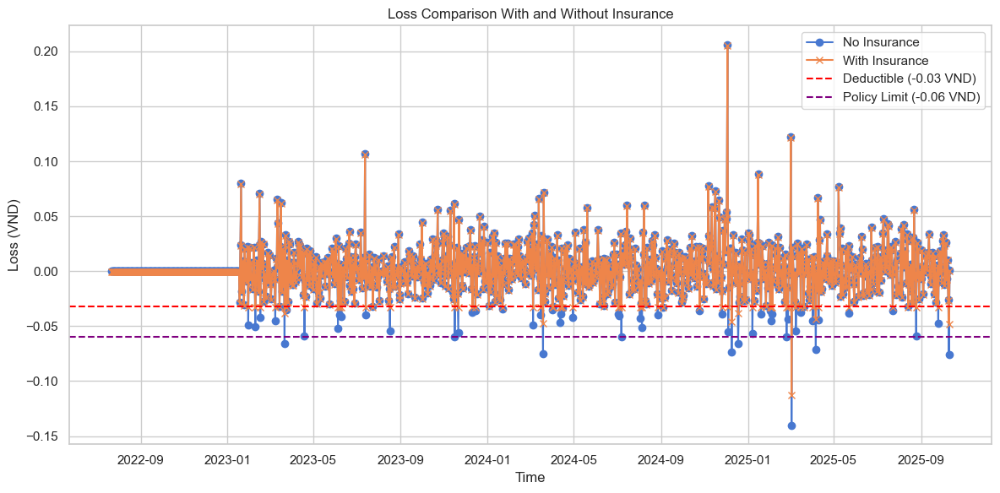

In [12]:
vni = alpha.insurance_advice(deductible=-0.0318,policy_limit=-0.06)
vni.plot_compare_loss()

The cumulative number of such extreme events is shown below:

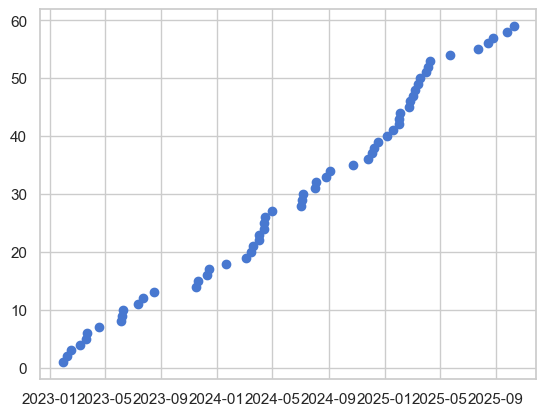

In [13]:
_temp=vni.incured_loss[vni.incured_loss!=0]
df=pd.DataFrame((_temp==_temp).cumsum().reindex(vni.loss.index).values,columns=["nfailures"],index=vni.loss.index)
df["time"]=range(len(df))
df=df.dropna()
df[["log_nfailures","log_time"]]=log(df)
plt.scatter(df.index,df["nfailures"])

Events are not uniformly distributed but occur in clusters, suggesting temporal dependence.

To validate this, the DBSCAN algorithm is applied:

In [14]:
from sklearn.cluster import DBSCAN

def cluster_failures(df, eps_seconds=3600*24*7, min_samples=2):
    """
    Cluster failure times using DBSCAN and visualize the results.
    
    Parameters:
    df (pd.DataFrame): Input DataFrame with timestamp index and 'nfailures' column
    eps_seconds (int): Maximum time distance for points to be considered in same cluster (default: 1 week)
    min_samples (int): Minimum number of points to form a cluster (default: 2)
    
    Returns:
    pd.DataFrame: DataFrame with added 'cluster' column
    """
    # Convert timestamp index to seconds for DBSCAN
    failure_times = df.index.astype(np.int64) // 10**9
    
    # Reshape to 2D array as required by DBSCAN
    X = np.array(failure_times).reshape(-1, 1)
    
    # Apply DBSCAN clustering
    db = DBSCAN(eps=eps_seconds, min_samples=min_samples).fit(X)
    
    # Create copy of DataFrame and add cluster labels
    df_clustered = df.copy()
    df_clustered['cluster'] = db.labels_


    # Initialize the figure
    fig = go.Figure()

    # Get unique cluster labels
    unique_labels = np.unique(db.labels_)

    # Add scatter traces for each cluster
    for label in unique_labels:
        mask = df_clustered['cluster'] == label
        cluster_name = f"Cluster {label}" if label != -1 else "Noise"
        
        fig.add_trace(go.Scatter(
            x=df_clustered[mask].index,
            y=df_clustered[mask]['nfailures'],
            mode='markers',
            name=cluster_name,
            opacity=0.6,
            marker=dict(size=6)
        ))

    # Layout settings
    fig.update_layout(
        title="DBSCAN Clustering of Failures by Time",
        xaxis_title="Time",
        yaxis_title="Number of Failures",
        template="plotly_dark",
        height=450,
        legend_title="Cluster"
    )

    fig.show()  
    return df_clustered

result = cluster_failures(df, eps_seconds=3600*24*14, min_samples=2)


In [15]:
def analyze_clusters(df_clustered):
    # Chỉ giữ lại các điểm thuộc cụm hợp lệ (loại bỏ noise -1)
    df_valid = df_clustered[df_clustered['cluster'] != -1].copy()
    df_valid["nfailures"]=1
    if df_valid.empty:
        print("⚠️ Không có cụm nào được phát hiện (chỉ có noise).")
        return None
    
    # -----------------------
    # 1. Tính stats cho từng cụm
    # -----------------------
    cluster_stats = df_valid.groupby('cluster').agg(
        cluster_start=('nfailures', lambda x: df_valid.loc[x.index.min()].name),
        cluster_end=('nfailures', lambda x: df_valid.loc[x.index.max()].name),
        duration_days=('nfailures', lambda x: (df_valid.loc[x.index.max()].name - df_valid.loc[x.index.min()].name).days),
        count=('nfailures', 'count'),
        total_failures=('nfailures', 'sum'),
        # max_failure=('nfailures', 'max'),
        # mean_failure=('nfailures', 'mean'),
        # std_failure=('nfailures', 'std')
    )
    cluster_stats['duration_days'] = cluster_stats['duration_days'].clip(lower=1)
    # print(cluster_stats)
    # -----------------------
    # 2. Khoảng cách giữa các cụm
    # -----------------------
    cluster_stats = cluster_stats.sort_values('cluster_start')
    cluster_stats['gap_days'] = cluster_stats['cluster_start'].diff().dt.days


    # -----------------------
    # 3. Bar plot: Total failures per cluster
    # -----------------------
    fig1 = go.Figure(
        go.Bar(
            x=cluster_stats.index,
            y=cluster_stats['total_failures'],
            text=cluster_stats['total_failures'],
            textposition='auto',
            marker_color='indianred'
        )
    )
    # -----------------------
    # 3. Bar chart: Total failures per cluster
    # -----------------------
    fig1.update_layout(
        title="Total Failures per Cluster",
        xaxis_title="Cluster",
        yaxis_title="Number of Failures",
        template="plotly_dark",
        height=400
    )
    fig1.show()

    # -----------------------
    # 4. Line plot: Gap days between clusters
    # -----------------------
    fig2 = go.Figure(
        go.Scatter(
            x=cluster_stats.index,
            y=cluster_stats['gap_days'],
            mode="lines+markers",
            marker=dict(color='lightblue', size=8),
            line=dict(color='lightblue')
        )
    )
    fig2.update_layout(
        title="Time Gap Between Clusters (days)",
        xaxis_title="Cluster",
        yaxis_title="Days",
        template="plotly_dark",
        height=400
    )
    fig2.show()

    # -----------------------
    # 5. Histogram: Number of points per cluster
    # -----------------------
    fig3 = px.histogram(
        cluster_stats,
        x="count",
        nbins=10,
        title="Distribution of Points per Cluster",
        labels={"count": "Number of Failure Points"},
        template="plotly_dark"
    )
    fig3.update_layout(
        xaxis_title="Number of Failure Points",
        yaxis_title="Number of Clusters",
        bargap=0.2,
        height=400
    )
    fig3.show()

    
    return cluster_stats
cluster_summary = analyze_clusters(result)
cluster_summary

,cluster_start,cluster_end,duration_days,count,total_failures,gap_days
cluster,,,,,,
0,2023-01-30,2023-02-16,17,3,3,NaN
1,2023-03-09,2023-03-24,15,3,3,38.0
2,2023-06-05,2023-06-10,5,3,3,88.0
3,2023-07-14,2023-07-24,10,2,2,39.0
4,2023-11-16,2023-11-21,5,2,2,125.0
5,2023-12-11,2023-12-15,4,2,2,25.0
6,2024-03-05,2024-04-15,41,8,8,85.0
7,2024-07-03,2024-07-07,4,3,3,120.0
8,2024-08-02,2024-08-05,3,2,2,30.0


In [16]:
cluster_summary.mean()

cluster_start     2024-04-05 01:42:51.428571392
cluster_end       2024-04-20 15:25:42.857142784
duration_days                         15.571429
count                                  3.571429
total_failures                         3.571429
gap_days                              71.307692
dtype: object

## 2.3. Predicting the Next Crash (Linear Regression)

                            OLS Regression Results                            
Dep. Variable:              nfailures   R-squared:                       0.980
Model:                            OLS   Adj. R-squared:                  0.980
Method:                 Least Squares   F-statistic:                     2846.
Date:                Sun, 19 Oct 2025   Prob (F-statistic):           2.40e-50
Time:                        23:45:14   Log-Likelihood:                -135.04
No. Observations:                  59   AIC:                             274.1
Df Residuals:                      57   BIC:                             278.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -11.8974      0.847    -14.053      0.0

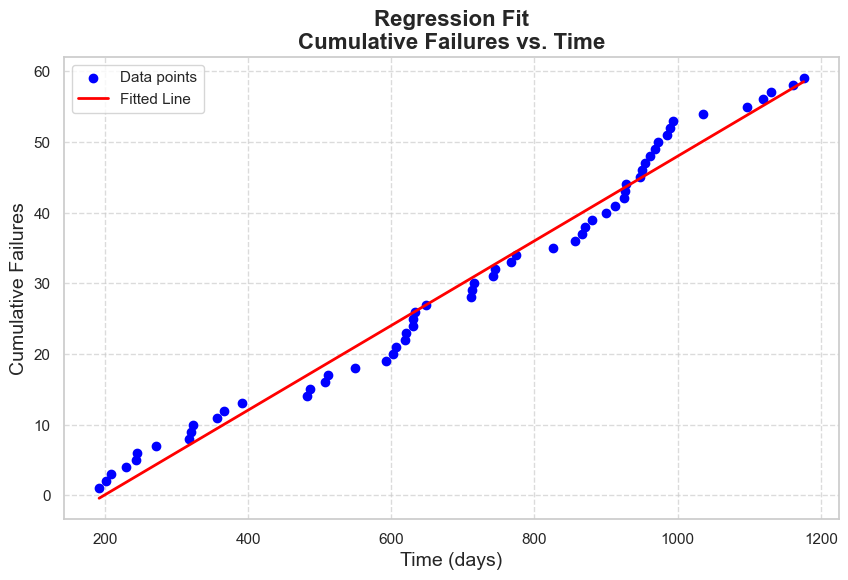

Predicted datetime for the 160th failure: 2030-05-31 23:56:03.901806688
Days from now (2025-10-10 00:00:00): 1694 days
Predicted datetime for the 200th failure: 2032-03-30 01:39:59.470028832
Days from now (2025-10-10 00:00:00): 2363 days
Predicted datetime for the 250th failure: 2034-07-13 03:49:53.930306432
Days from now (2025-10-10 00:00:00): 3198 days


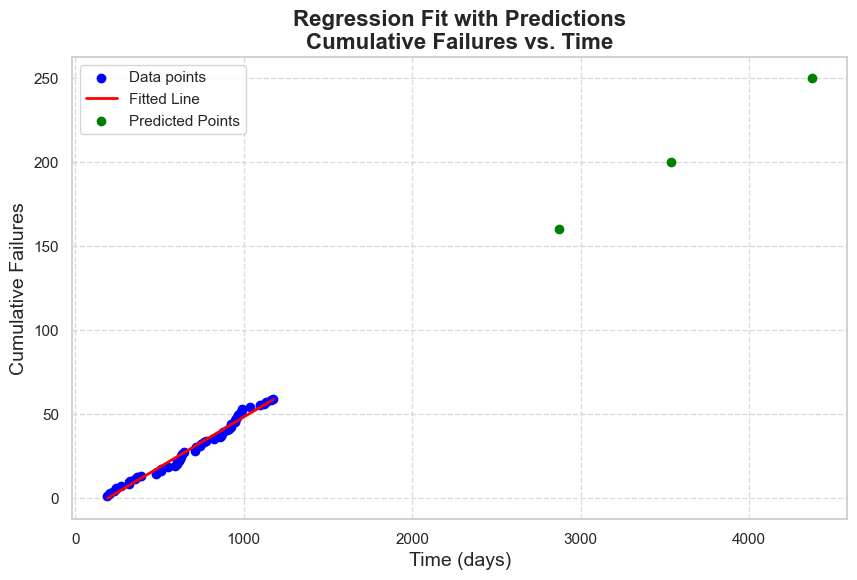

In [17]:
import statsmodels.api as sm

# Assuming df is your DataFrame with 'time' (days) and 'nfailures' columns, and df.index is datetime
# Performing linear regression on time (days) vs nfailures
x = sm.add_constant(df['time'])  # Add intercept
y = df['nfailures']
model = sm.OLS(y, x)
results = model.fit()

# Displaying regression results summary
print(results.summary())

# Visualizing the regression fit
plt.figure(figsize=(10, 6))
plt.scatter(df['time'], df['nfailures'], color='blue', label="Data points")
plt.plot(df['time'], results.predict(x), color='red', linewidth=2, label="Fitted Line")
plt.xlabel("Time (days)", fontsize=14)
plt.ylabel("Cumulative Failures", fontsize=14)
plt.title("Regression Fit\nCumulative Failures vs. Time", fontsize=16, weight='bold')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# Function to predict datetime for the nth failure
def predict_nth_failure_datetime(n, intercept, slope, last_time, last_datetime):
    predicted_time_days = (n - intercept) / slope
    days_difference = predicted_time_days - last_time
    return last_datetime + pd.Timedelta(days=days_difference)

# Extract regression coefficients
intercept = results.params['const']
slope = results.params['time']

# Get last time and datetime from DataFrame
last_time = df['time'].iloc[-1]
last_datetime = df.index[-1]

# Example: Predict datetime for the 100th, 200th, and 300th failure
n_values = [160, 200, 250]
predicted_datetimes = [predict_nth_failure_datetime(n, intercept, slope, last_time, last_datetime) for n in n_values]

# Print results (considering current date: 07:36 PM +07, August 06, 2025)
current_datetime = df.index[-1]
for n, dt in zip(n_values, predicted_datetimes):
    days_until = (dt - current_datetime).days
    print(f"Predicted datetime for the {n}th failure: {dt}")
    print(f"Days from now ({current_datetime}): {days_until} days")

# Optional: Visualize predicted points
plt.figure(figsize=(10, 6))
plt.scatter(df['time'], df['nfailures'], color='blue', label="Data points")
plt.plot(df['time'], results.predict(x), color='red', linewidth=2, label="Fitted Line")

# Convert predicted times back to numeric (days) for plotting
predicted_times = [(dt - last_datetime).days + last_time for dt in predicted_datetimes]
plt.scatter(predicted_times, n_values, color='green', label="Predicted Points", zorder=5)

plt.xlabel("Time (days)", fontsize=14)
plt.ylabel("Cumulative Failures", fontsize=14)
plt.title("Regression Fit with Predictions\nCumulative Failures vs. Time", fontsize=16, weight='bold')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

## 2.4. Additional Analysis

### 2.4.1. Chain Ladder Method

In [18]:
vni.plot_frequency_heat(title="Frequency of Number of Loss")

In [19]:
df = vni.cal_frequency_heat().fillna(0)
cum_df = df.cumsum(axis=1)
cum_df

Period,1,2,3,4,5,6,7,8,9,10,11,12
Year,,,,,,,,,,,,
2023,1.0,3.0,6.0,7.0,7.0,10.0,12.0,13.0,13.0,13.0,15.0,17.0
2024,1.0,1.0,4.0,10.0,10.0,10.0,13.0,16.0,17.0,18.0,19.0,22.0
2025,2.0,7.0,11.0,14.0,15.0,15.0,16.0,18.0,19.0,20.0,20.0,20.0


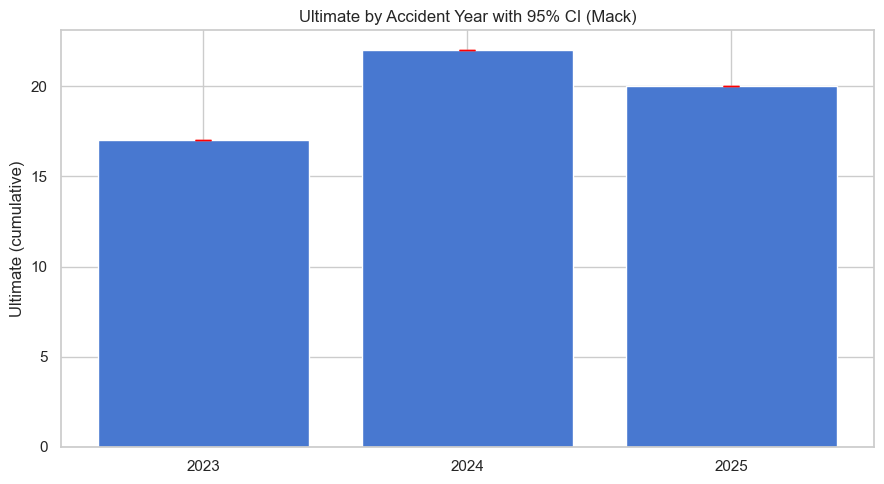

Total Ultimate = 59.000 | 95% CI = (59.000, 59.000)

Per-AY Ultimate with 95% CI:
      Latest  Ultimate  StdErr  CI_low  CI_high  IBNR
Year                                                 
2023    17.0      17.0     0.0    17.0     17.0   0.0
2024    22.0      22.0     0.0    22.0     22.0   0.0
2025    20.0      20.0     0.0    20.0     20.0   0.0


In [20]:
tri = cum_df.copy()

# ensure development periods are numeric and sorted
tri.columns = (pd.Index(tri.columns.astype(str))
                 .str.extract(r'(\d+)', expand=False).astype(int))
tri = tri.reindex(sorted(tri.columns), axis=1)

# ---- Mack Chain-Ladder (pure Python) ----
def mack_chainladder(cum_df: pd.DataFrame):
    C = cum_df.astype(float).copy()
    C = C.sort_index().sort_index(axis=1)
    J = C.shape[1]

    # age-to-age factors
    f = {}
    for j in range(J - 1):
        cj, cj1 = C.iloc[:, j], C.iloc[:, j + 1]
        m = (~cj.isna()) & (~cj1.isna()) & (cj != 0)
        f[j] = (cj1[m].sum() / cj[m].sum()) if m.any() else np.nan
    f = pd.Series(f, index=range(J - 1), name="age_to_age")

    # Mack sigma^2
    sigma2 = {}
    for j in range(J - 1):
        cj, cj1 = C.iloc[:, j], C.iloc[:, j + 1]
        m = (~cj.isna()) & (~cj1.isna()) & (cj > 0)
        n = m.sum()
        if n >= 2 and pd.notna(f[j]):
            resid = (cj1[m] / cj[m]) - f[j]
            sigma2[j] = (1.0 / (n - 1)) * np.sum(cj[m] * resid**2)
        else:
            sigma2[j] = np.nan
    sigma2 = pd.Series(sigma2, index=range(J - 1), name="sigma2")

    # project cumulative triangle
    proj = C.copy()
    for i in range(len(C)):
        obs = np.where(~proj.iloc[i].isna())[0]
        if len(obs) == 0: 
            continue
        ki = int(obs.max())
        for j in range(ki, J - 1):
            if pd.isna(proj.iat[i, j + 1]):
                proj.iat[i, j + 1] = proj.iat[i, j] * f[j]

    # IBNR SE by AY (Mack)
    latest = C.apply(lambda s: s[~s.isna()].iloc[-1] if (~s.isna()).any() else np.nan, axis=1)
    ultimate = proj.iloc[:, -1]
    ibnr_by_ay = (ultimate - latest).rename("IBNR")

    se2_by_ay = pd.Series(0.0, index=C.index)
    Jm1 = J - 1
    for i in range(len(C)):
        obs = np.where(~C.iloc[i].isna())[0]
        if len(obs) == 0:
            continue
        ki = int(obs.max())
        Ci_ki = C.iat[i, ki]
        s = 0.0
        for j in range(ki, Jm1):
            # tail product Π_{l=j+1}^{J-1} f_l
            prod_tail = 1.0 if j == Jm1 - 1 else float(np.prod([f[l] for l in range(j + 1, Jm1)]))
            s += (prod_tail ** 2) * sigma2[j]
        se2_by_ay.iloc[i] = Ci_ki * s
    se_by_ay = np.sqrt(se2_by_ay).rename("StdErr")

    ibnr_total = ibnr_by_ay.sum()
    se_total = float(np.sqrt(np.nansum(se2_by_ay.values)))

    return f, sigma2, proj, latest, ultimate, ibnr_by_ay, se_by_ay, ibnr_total, se_total

f, sigma2, proj, latest, ultimate, ibnr_by_ay, se_by_ay, ibnr_total, se_total = mack_chainladder(tri)

# ====== CI for Ultimate by AY ======
# Under Mack, Latest is known ⇒ Var(Ultimate) = Var(IBNR)
z = 1.96  # 95% CI (use 1.645 for 90%)
ult_mean = ultimate
ult_se   = se_by_ay
ci_low   = ult_mean - z * ult_se
ci_high  = ult_mean + z * ult_se

# Optional: clip CI lower bound at 'latest' (ensures monotone cumulative)
ci_low = np.maximum(ci_low, latest)

# ====== Plot: Ultimate with 95% CI ======
plt.figure(figsize=(9, 5))
x = np.arange(len(ult_mean))
plt.bar(x, ult_mean.values)  # one plot only; default colors
plt.errorbar(x, ult_mean.values, yerr=z * ult_se.values, fmt='none', capsize=6,color="red")
plt.xticks(x, ult_mean.index, rotation=0)
plt.ylabel("Ultimate (cumulative)")
plt.title("Ultimate by Accident Year with 95% CI (Mack)")
plt.tight_layout()
plt.show()

# ====== (Optional) Total Ultimate + CI ======
total_ult_mean = ult_mean.sum()
total_ult_se   = se_total   # Mack total SE
total_ci = (total_ult_mean - z * total_ult_se, total_ult_mean + z * total_ult_se)
print(f"Total Ultimate = {total_ult_mean:.3f} | 95% CI = ({total_ci[0]:.3f}, {total_ci[1]:.3f})")

# ====== Small summary table ======
summary = pd.DataFrame({
    "Latest": latest,
    "Ultimate": ult_mean.round(3),
    "StdErr": ult_se.round(3),
    "CI_low": ci_low.round(3),
    "CI_high": ci_high.round(3),
    "IBNR": (ult_mean - latest).round(3)
})
print("\nPer-AY Ultimate with 95% CI:")
print(summary)


By aggregating monthly claims and applying the Chain Ladder Method, the expected number of future extreme events can be estimated.

This method can also be extended to Severity and Frequency analysis, enabling estimation of ultimate losses.

A stochastic reserve model (e.g., Mack Model) can further refine these forecasts.

In [21]:
# vni.plot_severity_heat()
plot_heatmap(vni.cal_severity_heat() , "M", 
        figsize = (12, 8),
        cmap = "RdYlGn",
        title = "Severity per Loss",)

### 2.4.1. Actuarial index

#### 2.4.1.1 LER

The ***loss elimination ratio (LER)*** measures how much the insurer saves by imposing an ordinary deductible.

So what does the insurer no longer pay, on average, after imposing an ordinary deductible? It is the portion of the loss that the policyholder has to pay, on average, i.e.,

$$
\text{E}\!\left[X\wedge d\right]
$$

Divide that by the average full loss amount, $E[X]$, to compute the LER.

$$
LER = \dfrac{\text{E}\!\left[X\wedge d\right]}{\text{E}\!\left[X\right]} \tag{S2.3.2.4}
$$

In [22]:
vni.loss_elimination_ratio

0.8891138298757526

#### 2.4.1.2 ILF

The ***increased limit factor (ILF)*** measures how much more the insurer expects to pay by increasing the policy limit. As an example, if the ILF is 1.1, then the insurer expects to pay 10% more with the given policy limit increase.

It is calculated as:

$$
ILF = \dfrac{\text{E}\!\left[X\wedge u\right]}{\text{E}\!\left[X\wedge b\right]} \tag{S2.3.1.3}
$$

where $b$ is the original limit and $u$ is the increased limit.

In [23]:
vni.cal_increased_limit_factor(new_limit=-0.07)

1.0764981641450142

#### 2.4.1.3. Payment per Loss vs. Payment per Payment

In [24]:
payment_per_loss=np.mean(vni.incured_loss[vni.loss<0])
payment_per_payment=np.mean(vni.incured_loss[vni.incured_loss!=0])
print(payment_per_loss)
print(payment_per_payment)

-0.001736578093051343
-0.013657156528403784


#### 2.4.1.4. Loss Ratio

In [25]:
vni.plot_loss_ratio_heat()

### 2.4.2. State Analysis (Continuous Markov Chain)

**1. Generator Matrix $ Q $ Estimation**

The generator matrix $ Q $ defines the transition rates between states in a CTMC.

- **Input Data**:
  - Observed transitions between states.
  - Total time spent in each state.

- **Steps to Estimate $ Q $**:
  1. **Off-Diagonal Elements**:
     Estimate transition rates:
     $$
     Q_{ij} = \frac{\text{Number of transitions from state } i \text{ to } j}{\text{Total time spent in state } i}, \quad i \neq j.
     $$
  2. **Diagonal Elements**:
     Ensure rows sum to zero:
     $$
     Q_{ii} = -\sum_{j \neq i} Q_{ij}.
     $$

- **Key Property**:
  $ Q $ must satisfy:
  - $ Q_{ij} \geq 0 $ for $ i \neq j $ (non-negative rates),
  - $ Q_{ii} \leq 0 $ (negative holding rates),
  - Rows sum to zero: $ \sum_{j} Q_{ij} = 0 $.


In [26]:
profit = vni.loss > 0
loss1 = (vni.loss <= 0)*(vni.loss > -0.01)
loss2 = (vni.loss <= -0.01)*(vni.loss > -0.02)
loss3 = (vni.loss <= -0.02)*(vni.loss > -0.03)
loss4 = (vni.loss <= -0.03)*(vni.loss > -0.04)

# Tạo DataFrame từ dữ liệu loss
df = pd.DataFrame(vni.loss, columns=["loss"])

# Gán trạng thái dựa trên các điều kiện
df["status"] = np.where(
    loss1,
    "A",
    np.where(
        loss2,
        "B",
        np.where(loss3, "C",
            np.where(loss4,"D",
                     np.where(profit,"P","E")))
    )
)

# Tính tổng thời gian ở mỗi trạng thái
time_holding_at_status = df.groupby("status").count()

# Chuyển đổi cột 'status' thành danh sách
status_list = df["status"].tolist()

# Tạo danh sách các chuyển đổi giữa các trạng thái
transition_list = []
for i in range(len(status_list) - 1):
    current_status = status_list[i]
    next_status = status_list[i + 1]
    if current_status != next_status:
        transition = f"{current_status}{next_status}"
        transition_list.append(transition)

# Tạo DataFrame cho các chuyển đổi và đếm số lần xuất hiện
transition_df = pd.DataFrame(
    transition_list, columns=["Transition"]
).groupby("Transition").agg({"Transition": "count"})

# Đổi tên cột cho phù hợp
transition_df.columns = ["Num_transition"]
transition_df = transition_df.reset_index()

# Hàm tính tỷ lệ chuyển đổi
def calculate_rate(row):
    from_status = row["Transition"][0]
    num_transition = row["Num_transition"]
    total_time = time_holding_at_status.loc[from_status].values[0]
    return num_transition / total_time

# Áp dụng hàm tính tỷ lệ chuyển đổi
transition_df["rate"] = transition_df.apply(calculate_rate, axis=1)

# Tách cột 'Transition' thành 'From' và 'To'
transition_df[['From', 'To']] = transition_df['Transition'].apply(lambda x: pd.Series(list(x)))

transition_df.sort_values("rate", ascending=False)

,Transition,Num_transition,rate,From,To
13,CP,42,0.591549,C,P
8,BP,59,0.572816,B,P
22,EP,20,0.571429,E,P
17,DP,17,0.566667,D,P
4,AP,118,0.291358,A,P
18,EA,10,0.285714,E,A
14,DA,7,0.233333,D,A
23,PA,119,0.222846,P,A
5,BA,22,0.213592,B,A
9,CA,12,0.169014,C,A


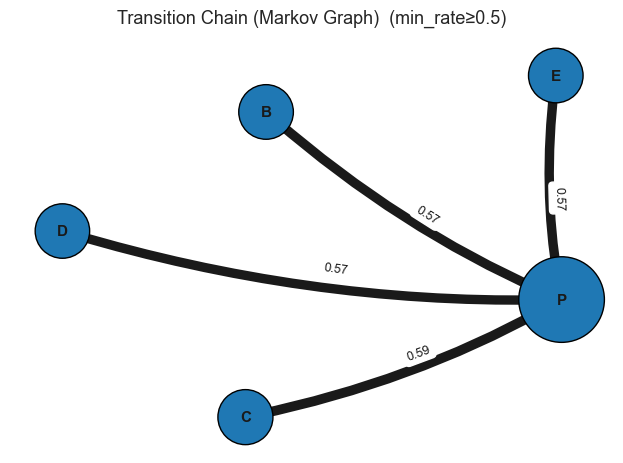

In [27]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

def plot_transition_chain(transition_df: pd.DataFrame,
                          min_rate: float = 0.05,
                          show_counts: bool = True,
                          node_order=None,
                          title: str = "Transition Chain (Markov Graph)"):
    """
    transition_df: DataFrame với các cột ['From','To','rate','Num_transition'].
    min_rate: chỉ vẽ các cạnh có rate >= min_rate (để đỡ rối).
    show_counts: nếu True, nhãn cạnh hiển thị cả (rate | count).
    node_order: danh sách thứ tự node mong muốn, ví dụ ['A','B','C','D','E','P'].
    """

    df = transition_df.copy()

    # Lọc cạnh theo ngưỡng
    df = df[df["rate"] >= min_rate].copy()
    if df.empty:
        raise ValueError("Không còn cạnh nào sau khi lọc theo min_rate. Hãy giảm min_rate.")

    # Tạo đồ thị có hướng
    G = nx.DiGraph()
    for _, r in df.iterrows():
        G.add_edge(r["From"], r["To"], rate=float(r["rate"]), count=int(r["Num_transition"]))

    # Thứ tự node (nếu cung cấp), nếu không dùng tất cả node hiện có
    nodes = list(G.nodes())
    if node_order:
        nodes = [n for n in node_order if n in G.nodes()] + [n for n in G.nodes() if n not in node_order]

    # Kích thước node theo tổng trọng số bậc (in+out)
    strength = {n: 0.0 for n in nodes}
    for u, v, d in G.edges(data=True):
        strength[u] += d["rate"]
        strength[v] += d["rate"]
    node_sizes = np.array([strength[n] for n in nodes])
    node_sizes = 800 + 3000 * (node_sizes / (node_sizes.max() if node_sizes.max() > 0 else 1))

    # Layout (spring để dễ đọc)
    pos = nx.spring_layout(G, seed=42, k=1/np.sqrt(max(len(nodes), 1)))

    # Vẽ node + nhãn
    nx.draw_networkx_nodes(G, pos, nodelist=nodes, node_size=node_sizes, linewidths=1, edgecolors="black")
    nx.draw_networkx_labels(G, pos, font_size=11, font_weight="bold")

    # Độ dày cạnh theo rate
    rates = np.array([d["rate"] for _, _, d in G.edges(data=True)])
    widths = 1.0 + 6.0 * rates / rates.max()

    # Vẽ cạnh (mũi tên)
    nx.draw_networkx_edges(G, pos, arrows=True, arrowsize=18, width=widths, connectionstyle="arc3,rad=0.08")

    # Nhãn cạnh
    edge_labels = {}
    for u, v, d in G.edges(data=True):
        if show_counts:
            # edge_labels[(u, v)] = f'{d["rate"]:.2f} | {d["count"]}'
            edge_labels[(u, v)] = f'{d["rate"]:.2f}'
        else:
            edge_labels[(u, v)] = f'{d["rate"]:.2f}'
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=9, label_pos=0.55)

    # Tiêu đề + chú thích
    plt.title(title + (f"  (min_rate≥{min_rate})" if min_rate is not None else ""), pad=12, fontsize=13)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

# --- Cách dùng ---
plot_transition_chain(transition_df, min_rate=0.5, show_counts=True, node_order=['A','B','C','D','E','P'])


The probability of a loss (of 2%, 3%, or 4% or more) being followed by a market rebound into profit is very high.

**2. Transition Probability Matrix $ P(t) $**

The transition probability matrix $ P(t) $ gives the probabilities of moving between states over time $ t $. It satisfies:

$$
P(t) = e^{Qt}, \quad \text{where } e^{Qt} = \sum_{k=0}^\infty \frac{(Qt)^k}{k!}.
$$

- **Key Relationship**: $ P'(t) = QP(t), \quad P(0) = I $ (identity matrix).


Efficient computation of $ e^{Qt} $ often uses matrix decomposition techniques.

1. **Eigenvalue Decomposition**:
   - If $ Q $ is diagonalizable:
     $$
     Q = V \Lambda V^{-1},
     $$
     where $ \Lambda $ is the diagonal matrix of eigenvalues of $ Q $, and $ V $ is the matrix of eigenvectors.

   - Compute:
     $$
     P(t) = e^{Qt} = V e^{\Lambda t} V^{-1},
     $$
     where $ e^{\Lambda t} $ is a diagonal matrix:
     $$
     e^{\Lambda t} = \text{diag}(e^{\lambda_1 t}, e^{\lambda_2 t}, \dots, e^{\lambda_n t}).
     $$

2. **Non-Diagonalizable Case**:
   - Use **Jordan decomposition**, but this is less common and computationally intensive.


In [28]:
def calculate_transition_matrix(t):
    # Sử dụng pivot_table để tạo ma trận chuyển đổi
    Q = transition_df.pivot_table(index='From', columns='To', values='rate', fill_value=0)
    for i in range(len(Q)):
        Q.iloc[i,i]=-Q.iloc[i,:].sum()

    # Tính giá trị riêng và vector riêng
    eigenvalues, eigenvectors = np.linalg.eig(Q)

    # Tạo ma trận D và S
    D = np.diag(eigenvalues)
    S = eigenvectors

    # Tính e^{tD}
    exp_tD = np.diag(np.exp(eigenvalues * t))

    # Tính P_t
    P_t = S @ exp_tD @ np.linalg.inv(S)

    P_t_df = pd.DataFrame(P_t, index=Q.index, columns=Q.columns)
    return P_t_df


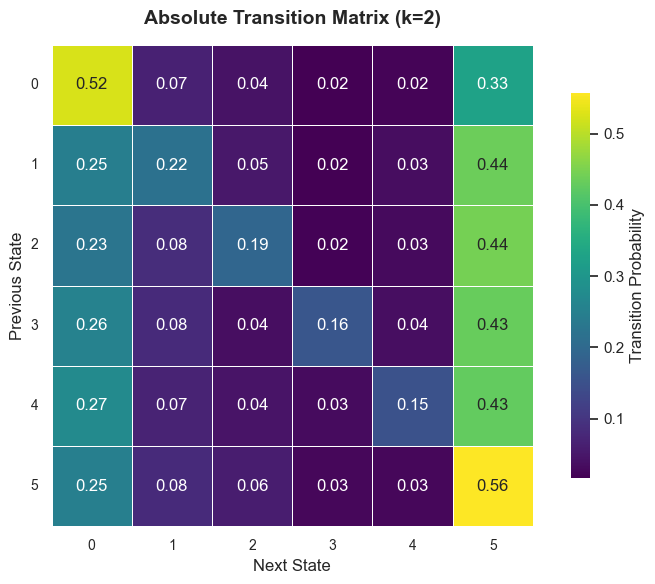

In [29]:
# --- Example transition matrix ---
mat = np.real(calculate_transition_matrix(2))

# --- Create figure ---
plt.figure(figsize=(8, 6))

# --- Improved heatmap ---
sns.heatmap(
    mat,
    cmap="viridis",              # or "coolwarm", "magma", "crest"
    annot=True,                  # show values in each cell
    fmt=".2f",                   # format numbers
    linewidths=0.5,              # grid lines between cells
    cbar_kws={"shrink": 0.8, "label": "Transition Probability"},
    square=True
)

# --- Styling ---
plt.title("Absolute Transition Matrix (k=2)", fontsize=14, fontweight="bold", pad=15)
plt.xlabel("Next State", fontsize=12)
plt.ylabel("Previous State", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10, rotation=0)
plt.tight_layout()

plt.show()


### 2.4.2. Frequency Analysis

Goodness-of-Fit --------------------------------


/opt/anaconda3/envs/VNFin/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:719: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/VNFin/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:6120: RuntimeWarning:

overflow encountered in divide

/opt/anaconda3/envs/VNFin/lib/python3.12/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning:

overflow encountered in reduce



Goodness-of-Fit Test Results:
nbinom: p-value = 0.9337
poisson: p-value = 0.6451
binom: p-value = 0.1881
gumbel_r: p-value = 0.1796
weibull_max: p-value = 0.1795
logistic: p-value = 0.0937
t: p-value = 0.0754
gumbel_l: p-value = 0.0549
norm: p-value = 0.0469
expon: p-value = 0.0181
laplace: p-value = 0.0181
exponweib: p-value = 0.0181
beta: p-value = 0.0102
f: p-value = 0.0042
weibull_min: p-value = 0.0002
uniform: p-value = 0.0000
pareto: p-value = 0.0000
lognorm: p-value = 0.0000
chi2: p-value = 0.0000
gamma: p-value = 0.0000

Based on the highest p-value, the data most likely follows a nbinom distribution.
Parameters of the best-fitting nbinom distribution:
  n = 4.488468906572351
  p = 0.7325292656970555


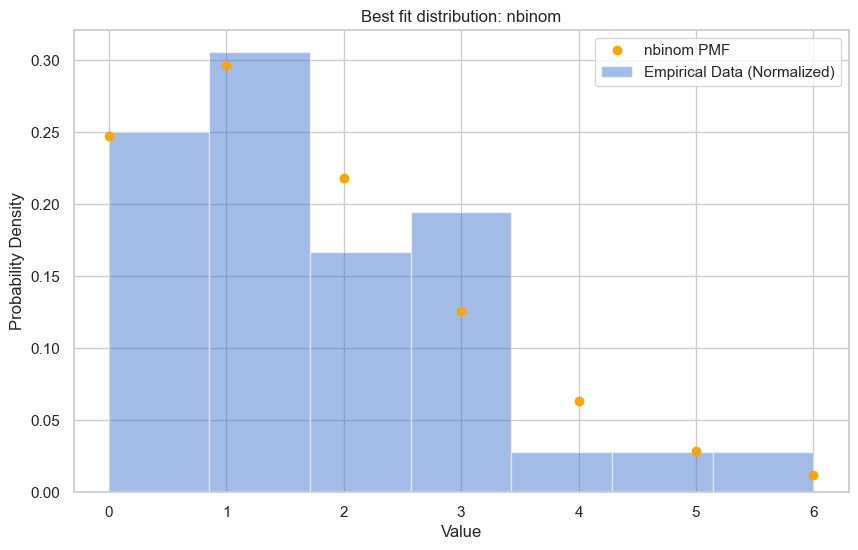

In [30]:
# Number of loss in each month
fre=vni.my_frequency_loss()
print("Goodness-of-Fit --------------------------------")
fre.distribution_type("stats")


**Compounding a Poisson distribution with a rate parameter distributed according to a gamma distribution yields a negative binomial distribution.** [³]

That is, if

$$
X \mid \Lambda = \lambda \sim \text{Poisson}(\lambda), \quad \text{and} \quad \Lambda \sim \text{Gamma}(r, \theta),

$$
then the marginal distribution of \( X \) is

$$
X \sim \text{NegativeBinomial}(r, p = \frac{1}{1+\theta}),
$$

with probability mass function

$$
P(X = k) = \frac{\Gamma(k + r)}{k! \, \Gamma(r)} \left(\frac{\theta}{1+\theta}\right)^k \left(\frac{1}{1+\theta}\right)^r, \quad k = 0, 1, 2, \dots

$$
This result shows that the negative binomial distribution can be interpreted as a **Poisson–Gamma mixture**, where the randomness in the Poisson rate (heterogeneity across observations) is modeled by a gamma prior.

#### 2.4.2.1. Predicting Number of Crash

##### 2.4.2.1.1. Nonhomogenous Poisson


A Nonhomogeneous Poisson Process is characterized by a time-dependent intensity function, making it useful in modeling events that occur with rates that vary over time.

Intensity Rate (Loss Rate)

The intensity rate $\lambda(t)$ determines how the rate of event occurrence changes over time. For a specific form of NHPP, the intensity rate is given by:

$$
\lambda(t) = \alpha \beta t^{\beta-1}
$$

Where:
- $\alpha > 0$: Scale parameter
- $\beta > 0$: Shape parameter
- $t > 0$: Time

Integrated Intensity Function

The integrated intensity function, $\Lambda(t)$, is the cumulative rate up to time $t$ and is calculated as:

$$
\Lambda(t) = \int_0^t \lambda(u) \, du = \int_0^t \alpha \beta u^{\beta-1} \, du = \alpha t^\beta
$$

Expected Value of $N(t)$

The expected number of events $N(t)$ occurring by time $t$ is given by the integrated intensity function:

$$
\mathbb{E}[N(t)] = \Lambda(t) = \alpha t^\beta
$$

**Estimation**

Log-Linear Form

The parameters $\alpha$ and $\beta$ can be estimated using a log-linear relationship:

$$
\ln(\hat{N}(t)) = \ln \hat{\alpha} + \hat{\beta} \ln t
$$

Where:
- $\hat{\alpha}$: Estimated scale parameter
- $\hat{\beta}$: Estimated shape parameter
- $\hat{N}(t)$: Observed number of events at day $t$

This relationship is particularly useful for fitting NHPP models to data using regression techniques.


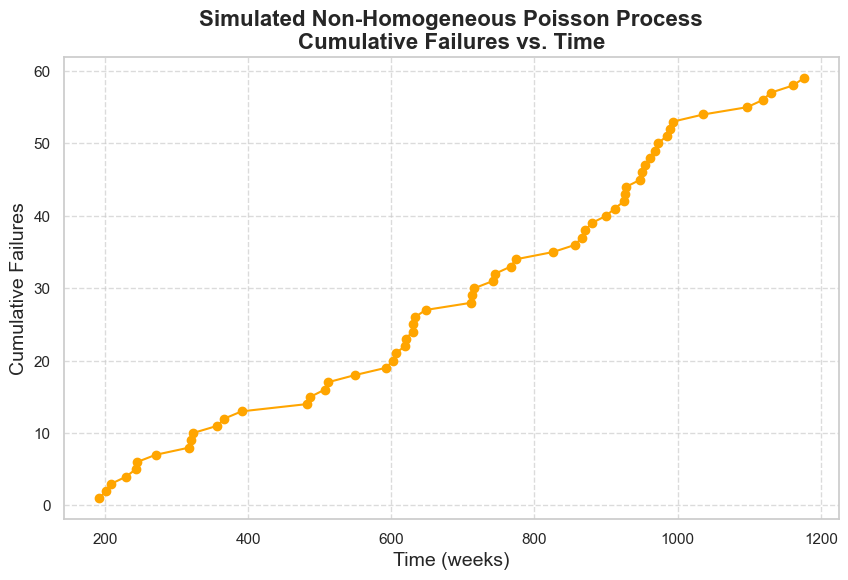

                            OLS Regression Results                            
Dep. Variable:          log_nfailures   R-squared:                       0.955
Model:                            OLS   Adj. R-squared:                  0.954
Method:                 Least Squares   F-statistic:                     1203.
Date:                Sun, 19 Oct 2025   Prob (F-statistic):           5.19e-40
Time:                        23:45:17   Log-Likelihood:                 14.341
No. Observations:                  59   AIC:                            -24.68
Df Residuals:                      57   BIC:                            -20.53
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -8.0265      0.323    -24.881      0.0

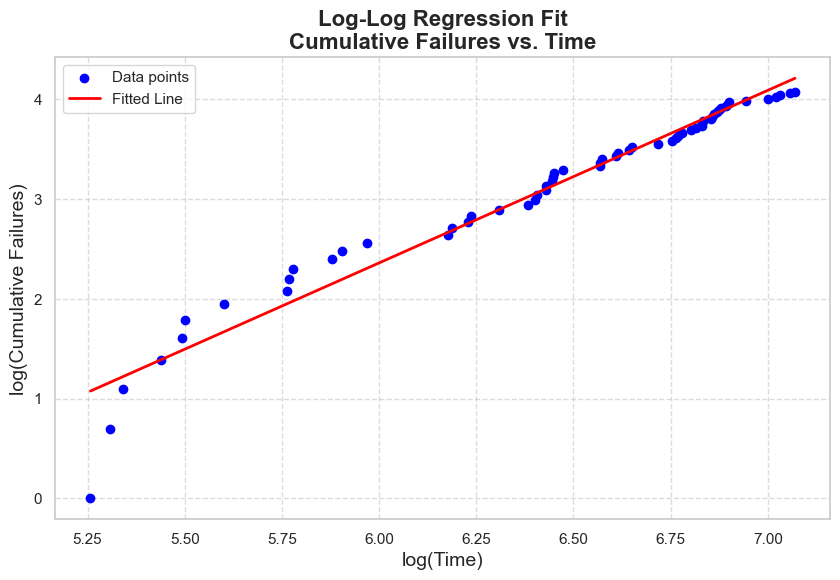

In [31]:
_temp=vni.incured_loss[vni.incured_loss!=0]
df=pd.DataFrame((_temp==_temp).cumsum().reindex(vni.loss.index).values,columns=["nfailures"],index=vni.loss.index)
df["time"]=range(len(df))
df=df.dropna()
df[["log_nfailures","log_time"]]=log(df)

# Plotting the cumulative failures over time
plt.figure(figsize=(10, 6))
plt.plot(df['time'], df['nfailures'], marker='o', color='orange', linestyle='-', linewidth=1.5)
plt.xlabel("Time (weeks)", fontsize=14)
plt.ylabel("Cumulative Failures", fontsize=14)
plt.title("Simulated Non-Homogeneous Poisson Process\nCumulative Failures vs. Time", fontsize=16, weight='bold')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# Performing log-transformed linear regression on log(time) vs log(nfailures)
x = sm.add_constant(df['log_time'])  # Add intercept
y = df['log_nfailures']
model = sm.OLS(y, x)
results = model.fit()

# Displaying regression results summary
print(results.summary())

# Visualizing the regression fit on a log-log scale
plt.figure(figsize=(10, 6))
plt.scatter(df['log_time'], df['log_nfailures'], color='blue', label="Data points")
plt.plot(df['log_time'], results.predict(x), color='red', linewidth=2, label="Fitted Line")
plt.xlabel("log(Time)", fontsize=14)
plt.ylabel("log(Cumulative Failures)", fontsize=14)
plt.title("Log-Log Regression Fit\nCumulative Failures vs. Time", fontsize=16, weight='bold')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()


In [32]:
alpha_ols=np.exp(results.params["const"])
beta_ols=results.params["log_time"]
print(f"alpha {alpha_ols}")
print(f"beta {beta_ols}")

alpha 0.00032667938002604223
beta 1.7312108608471446


MLE Method 

/var/folders/w7/3q8cywj12cd3qncp6sgxxy2c0000gn/T/ipykernel_71087/3574751729.py:27: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`

/var/folders/w7/3q8cywj12cd3qncp6sgxxy2c0000gn/T/ipykernel_71087/3574751729.py:29: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`

/var/folders/w7/3q8cywj12cd3qncp6sgxxy2c0000gn/T/ipykernel_71087/3574751729.py:11: RuntimeWarning:

divide by zero encountered in log



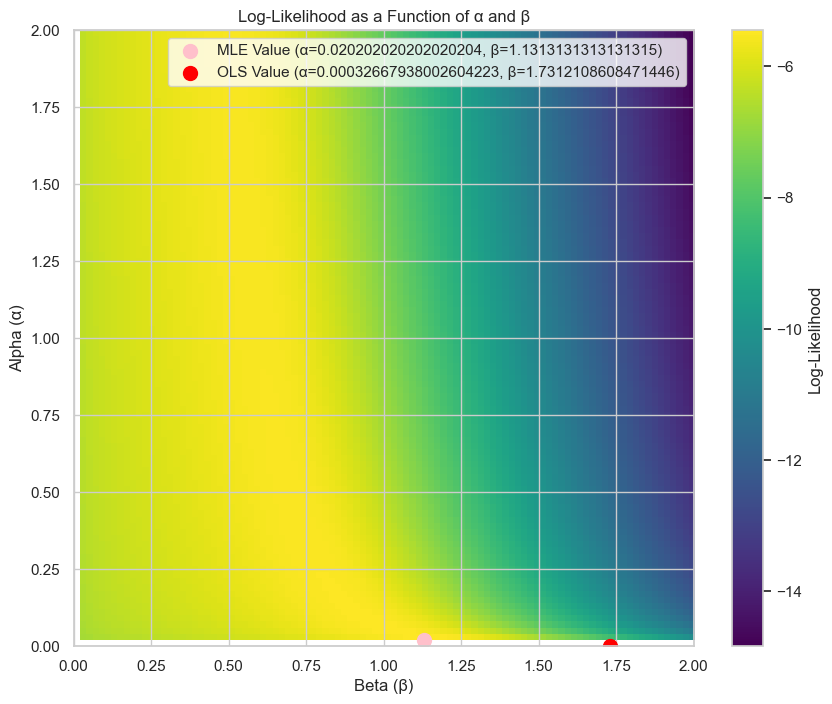

In [33]:
# Given data (from the image) - replace with actual data
time_data = df["time"].values
n_failures = df["nfailures"].values

# Define the log-likelihood function for a non-homogeneous Poisson process
def log_likelihood(alpha, beta, times):
    n = len(times)
    t_n = times[-1]

    # Part 1: Sum of log intensities
    part1 = n * np.log(alpha) + n * np.log(beta) + (beta - 1) * np.sum(np.log(times))

    # Part 2: Integral of lambda(t) from 0 to t_n
    part2 = alpha * t_n**beta

    # Combine parts for the log-likelihood
    return -np.log(-(part1 - part2))

# Generate a grid of (alpha, beta) values to explore
alpha_range = np.linspace(0, 2, 100)  # Adjust range as needed
beta_range = np.linspace(0, 2, 100)   # Adjust range as needed
log_likelihoods = []

tmp=pd.DataFrame(index=alpha_range,columns=beta_range)
tmp1=pd.DataFrame(index=alpha_range,columns=beta_range)
tmp[0]=alpha_range
tmp=tmp.ffill(axis=1)
tmp1.iloc[0]=beta_range
tmp1=tmp1.ffill()
heat_df=merge_matrix(tmp,tmp1)
final_df=heat_df.map(lambda x: log_likelihood(x[0], x[1], time_data))
plt.figure(figsize=(10, 8))
heatmap = plt.imshow(final_df, aspect='auto', origin='lower', cmap='viridis',
                     extent=[beta_range.min(), beta_range.max(), alpha_range.min(), alpha_range.max()])
plt.colorbar(heatmap, label="Log-Likelihood")
plt.xlabel("Beta (β)")
plt.ylabel("Alpha (α)")
plt.title("Log-Likelihood as a Function of α and β")

tp = final_df.max().max()  # Find the maximum value
coordinates = final_df[final_df == tp].stack().index.tolist()[0]  # Find the coordinates of the maximum value
true_alpha1,true_beta1=float(coordinates[0]), float(coordinates[1])
# Plot the true values of alpha and beta
plt.scatter(true_beta1, true_alpha1, color='pink', s=100, label=f"MLE Value (α={true_alpha1}, β={true_beta1})")
plt.scatter(beta_ols, alpha_ols, color='red', s=100, label=f"OLS Value (α={alpha_ols}, β={beta_ols})")
plt.legend()
plt.show()

##### 2.4.2.1.1. GLM


/opt/anaconda3/envs/VNFin/lib/python3.12/site-packages/statsmodels/genmod/families/family.py:1367: ValueWarning:

Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.

/opt/anaconda3/envs/VNFin/lib/python3.12/site-packages/statsmodels/genmod/generalized_linear_model.py:308: DomainWarning:

The InversePower link function does not respect the domain of the Gamma family.



Best distribution: Gaussian
                 Generalized Linear Model Regression Results                  
Dep. Variable:          log_nfailures   No. Observations:                   59
Model:                            GLM   Df Residuals:                       56
Model Family:                Gaussian   Df Model:                            2
Link Function:               Identity   Scale:                       0.0048255
Method:                          IRLS   Log-Likelihood:                 75.170
Date:                Sun, 19 Oct 2025   Deviance:                      0.27023
Time:                        23:45:18   Pearson chi2:                    0.270
No. Iterations:                     3   Pseudo R-squ. (CS):              1.000
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercep

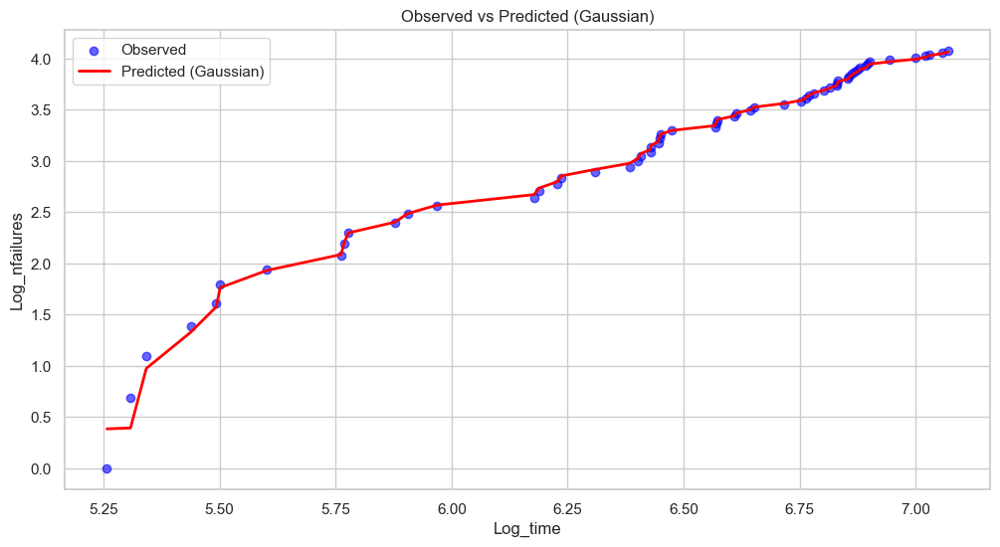

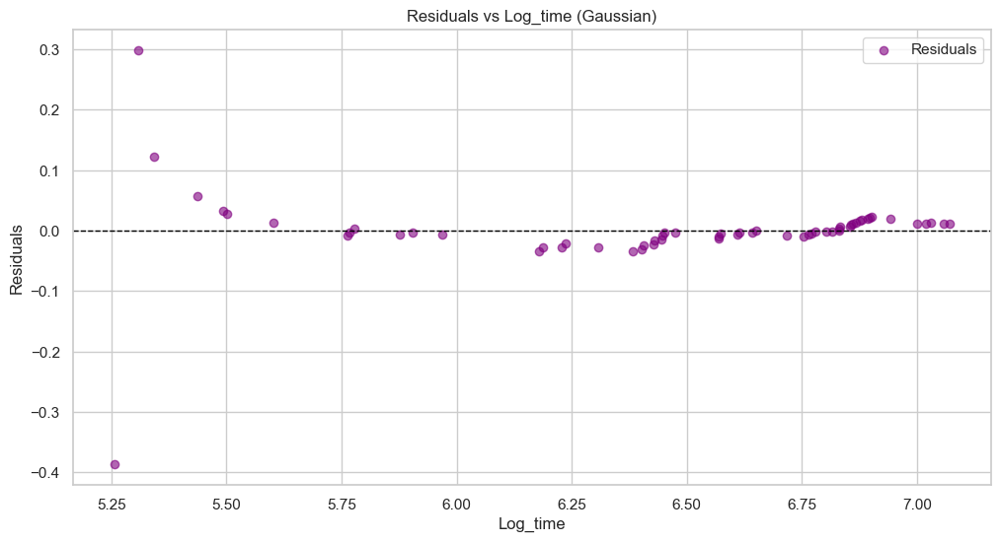

{'best_model': <statsmodels.genmod.generalized_linear_model.GLMResultsWrapper at 0x31e20fe30>,
 'best_distribution': 'Gaussian',
 'mse_values': {'Poisson': 0.021914507014241132,
  'NegativeBinomial': 0.027443568973880214,
  'Gaussian': 0.004580170400751485,
  'Gamma': 0.12935985767071775}}

In [34]:

from statsmodels.formula.api import glm
from sklearn.metrics import mean_squared_error

def fit_glm_auto_distribution(data, formula, independent_vars, dependent_var, models = None):
    # Define distributions to test
    model_families = {
        "Poisson": sm.families.Poisson(),
        "NegativeBinomial": sm.families.NegativeBinomial(),
        "Gaussian": sm.families.Gaussian(),
        "Gamma": sm.families.Gamma()
    }
    if models == None:
        families=model_families
    else:
        families = {model: model_families[model] for model in models}
    results = {}
    mse_values = {}

    # Fit GLM for each distribution
    for name, family in families.items():
        model = glm(formula=formula, data=data, family=family).fit()
        data[f'predicted_{name}'] = model.predict(data[independent_vars])
        mse = mean_squared_error(data[dependent_var], data[f'predicted_{name}'])
        results[name] = model
        mse_values[name] = mse

    # Choose the best distribution based on MSE
    best_distribution = min(mse_values, key=mse_values.get)
    best_model = results[best_distribution]

    # Summary of the best model
    print(f"Best distribution: {best_distribution}")
    print(best_model.summary())

    # Visualization
    plt.figure(figsize=(12, 6))
    plt.scatter(data[independent_vars[0]], data[dependent_var], label='Observed', color='blue', alpha=0.6)
    plt.plot(data[independent_vars[0]], data[f'predicted_{best_distribution}'], label=f'Predicted ({best_distribution})', color='red', linewidth=2)
    plt.title(f'Observed vs Predicted ({best_distribution})')
    plt.xlabel(independent_vars[0].capitalize())
    plt.ylabel(dependent_var.capitalize())
    plt.legend()
    plt.grid(True)
    plt.show()

    # Residual Analysis
    data['residuals'] = data[dependent_var] - data[f'predicted_{best_distribution}']
    plt.figure(figsize=(12, 6))
    plt.scatter(data[independent_vars[0]], data['residuals'], label='Residuals', color='purple', alpha=0.6)
    plt.axhline(0, color='black', linestyle='--', linewidth=1)
    plt.title(f'Residuals vs {independent_vars[0].capitalize()} ({best_distribution})')
    plt.xlabel(independent_vars[0].capitalize())
    plt.ylabel('Residuals')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Return the best model and comparison metrics
    return {
        "best_model": best_model,
        "best_distribution": best_distribution,
        "mse_values": mse_values
    }

# Simulate data
df["log_nfailures_lag1"]=ts_delay(df["log_nfailures"],1).fillna(0)
# Define the formula
formula = "log_nfailures ~ log_time + log_nfailures_lag1"

# Apply the function
result = fit_glm_auto_distribution(data=df, formula=formula, independent_vars=[ "log_time","log_nfailures_lag1"], dependent_var="log_nfailures")

result

# 3. Insurance Product


Investing in stock funds presents opportunities for growth but also exposes investors to significant market volatility and potential short-term losses. This proposal outlines the development of an insurance product designed to safeguard investors by capping daily losses at -3%. The insurance activates when a stock fund's daily return falls below this threshold, compensating investors for any additional losses beyond -3%.

This insurance product offers a novel approach to balancing investment growth with risk management, fostering a more secure environment for stock fund investors. The next steps involve market research, product refinement, stakeholder engagement, and comprehensive risk mitigation planning to ensure successful implementation.

## 3.1. Introduction

----------------------------------------------
Insurance premium to pay: 0.00 VND
----------------------------------------------
----------------------------------------------
Insurance payout received: 0.00 VND
----------------------------------------------
Expected Claim Method: -0.05
Chain Ladder Method: 0.11
Bornhuetter-Ferguson Method: 0.06
Chain Ladder Method: 0.11
Benktander Method: 0.09


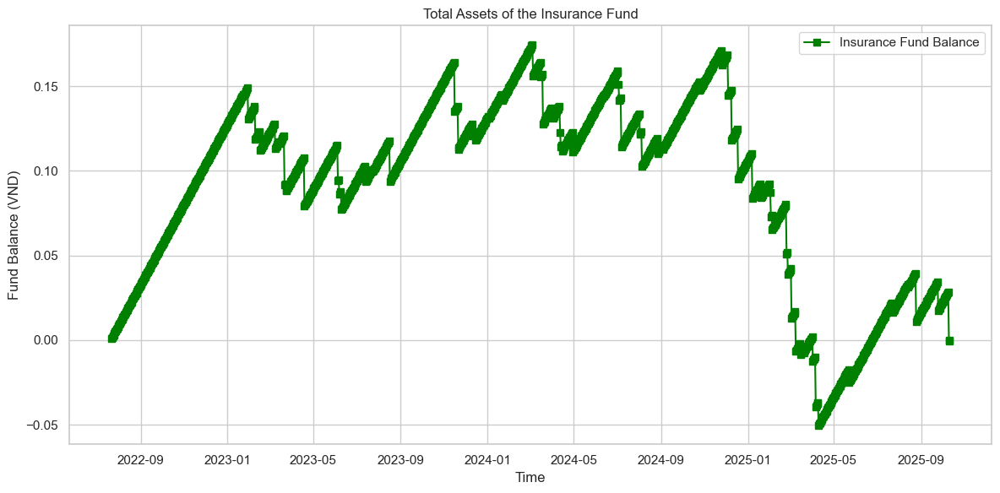

In [35]:
deductible=-0.03
policy_limit=-0.06
vni = alpha.insurance_advice(deductible=deductible,policy_limit=policy_limit,administrative_cost=0.0,profit_margin=0.0)
vni.plot_insurance_fund(interest=0)

/opt/anaconda3/envs/VNFin/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:719: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/VNFin/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:177: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.

/opt/anaconda3/envs/VNFin/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:6111: RuntimeWarning:

invalid value encountered in log



Goodness-of-Fit Test Results:
logistic: p-value = 0.0000
t: p-value = 0.0000
norm: p-value = 0.0000
beta: p-value = 0.0000
lognorm: p-value = 0.0000
exponweib: p-value = 0.0000
laplace: p-value = 0.0000
weibull_max: p-value = 0.0000
weibull_min: p-value = 0.0000
gumbel_r: p-value = 0.0000
gumbel_l: p-value = 0.0000
f: p-value = 0.0000
uniform: p-value = 0.0000
expon: p-value = 0.0000
pareto: p-value = 0.0000
gamma: p-value = 0.0000
chi2: p-value = 0.0000

Based on the highest p-value, the data most likely follows a logistic distribution.
Parameters of the best-fitting logistic distribution:
  loc = 0.0015730127368506575
  scale = 0.010766647940799455


/Users/ktmac/Library/CloudStorage/Dropbox/BOY/VNBrain/vnpackages/statistics/nonparametric_testing.py:58: UserWarning:

Data is not discrete. Discrete distributions will be skipped.



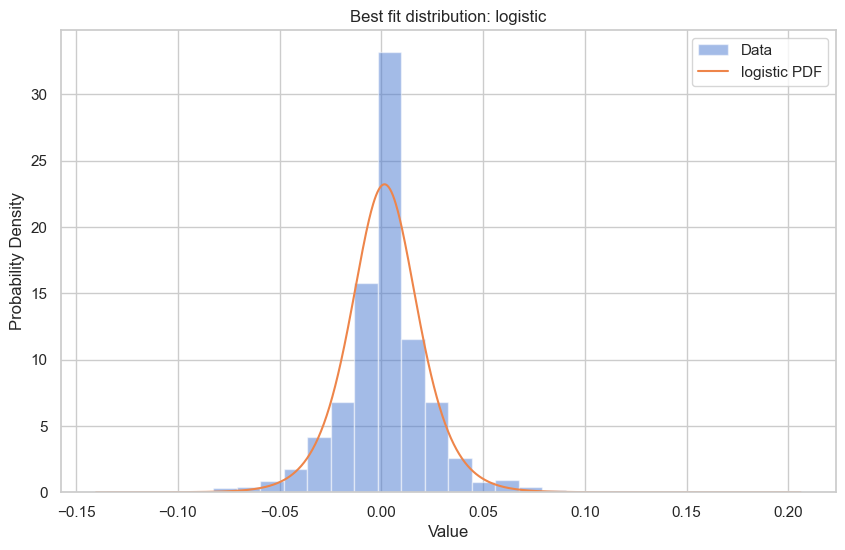

In [36]:
fitter = DistributionFitter(vni.loss)
fitter.fit_distributions()
fitter.print_results()
fitter.plot_best_fit()

In [37]:
import scipy.stats as stats
T=300 # Days the fund will ruin in T days
num_sim=300
def ruin_probability(initial_capital,T=100,num_sim=1000):
    # Parameters for the istribution
    loc = 0.0015730127368506575
    scale = 0.010766647940799455

    # Generate random data from the distribution
    data = stats.logistic.rvs(loc=loc, scale=scale, size=(num_sim,T))

    incured_loss=max_(min_(pd.DataFrame(data),deductible)-deductible,policy_limit-deductible)
    a=initial_capital+incured_loss.cumsum(axis=1)
    is_ruin=if_else(a<=0,1,0).sum(axis=1)
    probability_ruin=np.sum(is_ruin!=0)/len(is_ruin)
    return probability_ruin

In [38]:
ins_funds=pd.DataFrame(vni.cal_insurance_fund(interest=0),columns=["fund_balance"])
ins_funds["ruin prob"]=ins_funds["fund_balance"].apply(lambda x: 1 if x<=0 else ruin_probability(x,T,num_sim))
ins_funds

,fund_balance,ruin prob
TradingDate,,
2022-07-22,7.797544e-04,1.000000
2022-07-23,1.559509e-03,1.000000
2022-07-24,2.339263e-03,1.000000
2022-07-25,3.119018e-03,1.000000
2022-07-26,3.898772e-03,1.000000
...,...,...
2025-10-07,2.688098e-02,0.996667
2025-10-08,2.766074e-02,1.000000
2025-10-09,2.844049e-02,1.000000


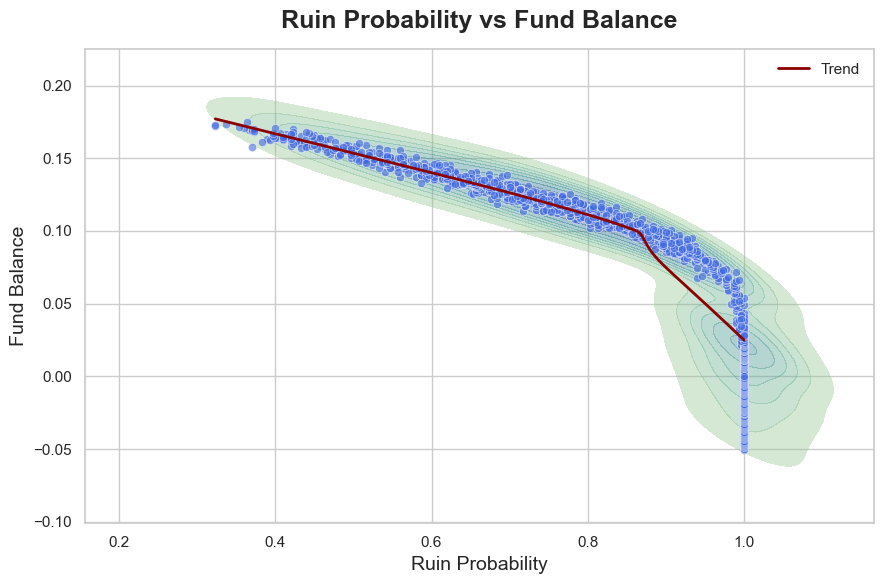

In [39]:
plt.figure(figsize=(9, 6))

# Density shading background
sns.kdeplot(
    x=ins_funds["ruin prob"],
    y=ins_funds["fund_balance"],
    fill=True,
    cmap="crest",
    thresh=0.05,
    alpha=0.4
)

# Scatter overlay (white-edged points)
plt.scatter(
    ins_funds["ruin prob"],
    ins_funds["fund_balance"],
    s=35,
    color="royalblue",
    alpha=0.6,
    edgecolors="white",
    linewidth=0.5
)

# Smooth LOWESS trend line
sns.regplot(
    x=ins_funds["ruin prob"],
    y=ins_funds["fund_balance"],
    scatter=False,
    color="darkred",
    lowess=True,
    line_kws={"linewidth": 2},
    label="Trend"
)

# Labels, title, legend
plt.title("Ruin Probability vs Fund Balance", fontsize=18, weight="bold", pad=15)
plt.xlabel("Ruin Probability", fontsize=14)
plt.ylabel("Fund Balance", fontsize=14)
plt.legend(frameon=False)
plt.tight_layout()
plt.show()


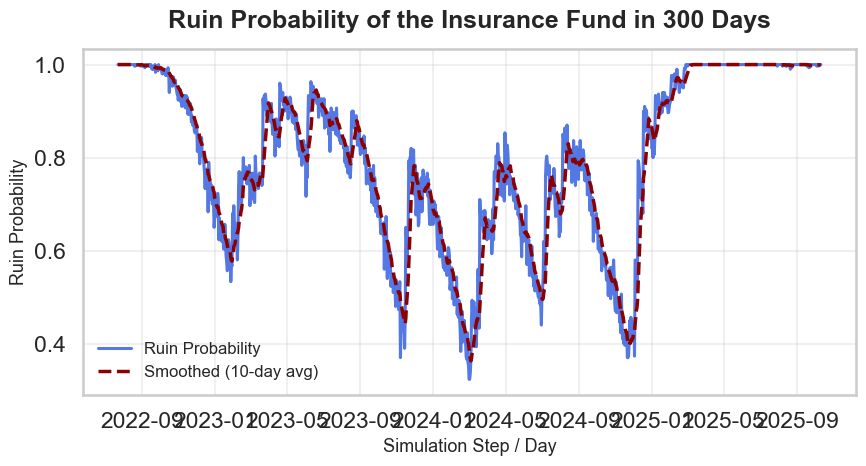

In [40]:
sns.set(style="whitegrid", context="talk")

plt.figure(figsize=(9, 5))

# Elegant time-series line
plt.plot(
    ins_funds["ruin prob"],
    color="royalblue",
    linewidth=2.2,
    alpha=0.9,
    label="Ruin Probability"
)

# Optional smoothed line (rolling average)
plt.plot(
    ins_funds["ruin prob"].rolling(window=10, min_periods=1).mean(),
    color="darkred",
    linewidth=2.5,
    linestyle="--",
    label="Smoothed (10-day avg)"
)

# Titles and labels
plt.title(f"Ruin Probability of the Insurance Fund in {T} Days",
          fontsize=18, weight="bold", pad=15)
plt.xlabel("Simulation Step / Day", fontsize=13)
plt.ylabel("Ruin Probability", fontsize=13)
plt.legend(frameon=False, fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


With current premium, what is the probability of default?

In [41]:
vni.insurance_premium

0.0007797543871348139

In [42]:

initial_capital=0
# Parameters for the istribution
loc = 0.0015730127368506575
scale = 0.010766647940799455

# Generate random data from the distribution
data = stats.logistic.rvs(loc=loc, scale=scale, size=(num_sim,T))

incured_loss=max_(min_(pd.DataFrame(data),deductible)-deductible,policy_limit-deductible)
revenue=initial_capital+pd.DataFrame(index=incured_loss.index,columns=incured_loss.columns).fillna(vni.insurance_premium)
revenue = revenue.cumsum(axis=1)
cum_loss = incured_loss.cumsum(axis=1)
# # Define the accumulation function
# accum_function = (1 + 0.06 / 360) ** (np.arange(revenue.shape[1])[::-1])

# # # Apply the accumulation function
# revenue = (revenue * accum_function).cumsum(axis=1)
# cum_loss = (incured_loss * accum_function).cumsum(axis=1)
fund_balance=revenue+cum_loss
res=if_else(fund_balance<=0,1,0).sum(axis=1)
P=np.sum(res!=0)/len(res)
print(f"Probability that ruin: {P}")

Probability that ruin: 0.6633333333333333


/var/folders/w7/3q8cywj12cd3qncp6sgxxy2c0000gn/T/ipykernel_71087/1775310830.py:10: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [43]:

def cal_stopping_time(initial_capital,T=100,num_sim=1000):
    loc = 0.0015730127368506575
    scale = 0.010766647940799455
    data = stats.logistic.rvs(loc=loc, scale=scale, size=(num_sim,T))

    incured_loss=max_(min_(pd.DataFrame(data),deductible)-deductible,policy_limit-deductible)
    a=initial_capital+incured_loss.cumsum(axis=1)
    is_ruin=if_else(a<=0,0,1)
    stopping_time=is_ruin.cumprod(axis=1).sum(axis=1).mean()
    return stopping_time

ins_funds=pd.DataFrame(vni.cal_insurance_fund(interest=0),columns=["fund_balance"])
ins_funds["stopping time"]=ins_funds["fund_balance"].apply(lambda x: 0 if x<=0 else cal_stopping_time(x,T,num_sim))
ins_funds

,fund_balance,stopping time
TradingDate,,
2022-07-22,7.797544e-04,18.596667
2022-07-23,1.559509e-03,20.456667
2022-07-24,2.339263e-03,20.626667
2022-07-25,3.119018e-03,23.746667
2022-07-26,3.898772e-03,25.843333
...,...,...
2025-10-07,2.688098e-02,68.680000
2025-10-08,2.766074e-02,68.453333
2025-10-09,2.844049e-02,69.090000


## 3.2. Optional Stopping Time

$$
T=\inf\{t\ge 0|BA_t\le0\}
$$

The equation above defines the first time the fund goes bankrupt, denoted as $ T $. It is the infimum of all times $ t \geq 0 $ when the fund's balance, $ BA_t $, becomes less than or equal to zero. This moment marks the onset of insolvency, highlighting the critical threshold where liabilities exceed available assets. Understanding $ T $ is essential for evaluating the risk of financial instability over time.

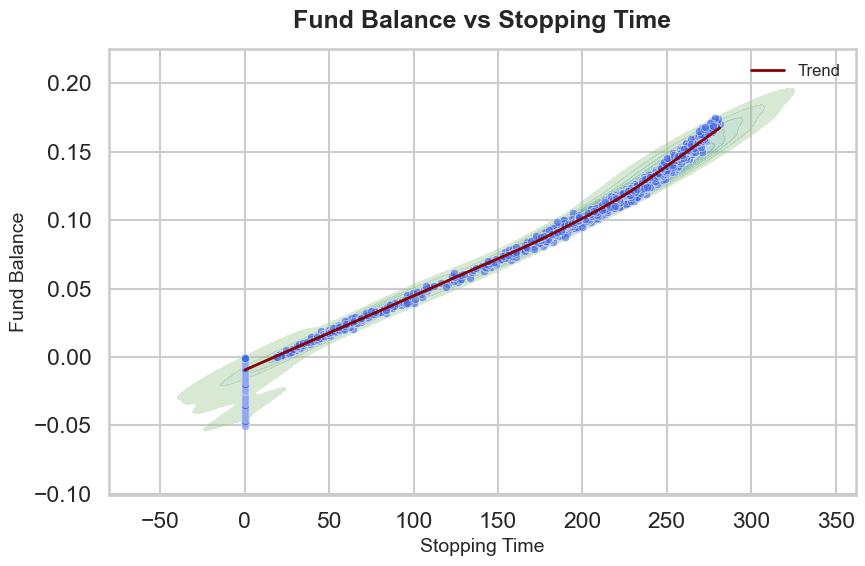

In [44]:
plt.figure(figsize=(9, 6))

# Optional: background density contour for structure
sns.kdeplot(
    x=ins_funds["stopping time"],
    y=ins_funds["fund_balance"],
    fill=True,
    cmap="crest",
    alpha=0.4,
    thresh=0.05
)

# Scatter points
plt.scatter(
    ins_funds["stopping time"],
    ins_funds["fund_balance"],
    s=35,
    color="royalblue",
    alpha=0.6,
    edgecolors="white",
    linewidth=0.5
)

# Trend line (LOWESS smoothing)
sns.regplot(
    x=ins_funds["stopping time"],
    y=ins_funds["fund_balance"],
    scatter=False,
    lowess=True,
    color="darkred",
    line_kws={"linewidth": 2},
    label="Trend"
)

# Titles and labels
plt.title("Fund Balance vs Stopping Time", fontsize=18, weight="bold", pad=15)
plt.xlabel("Stopping Time", fontsize=14)
plt.ylabel("Fund Balance", fontsize=14)
plt.legend(frameon=False, fontsize=12)
plt.tight_layout()
plt.show()


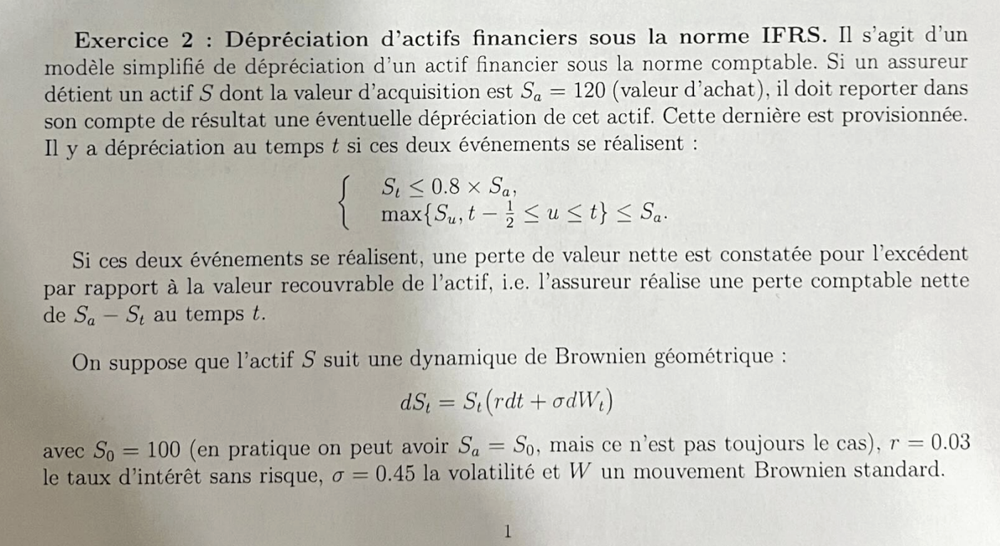

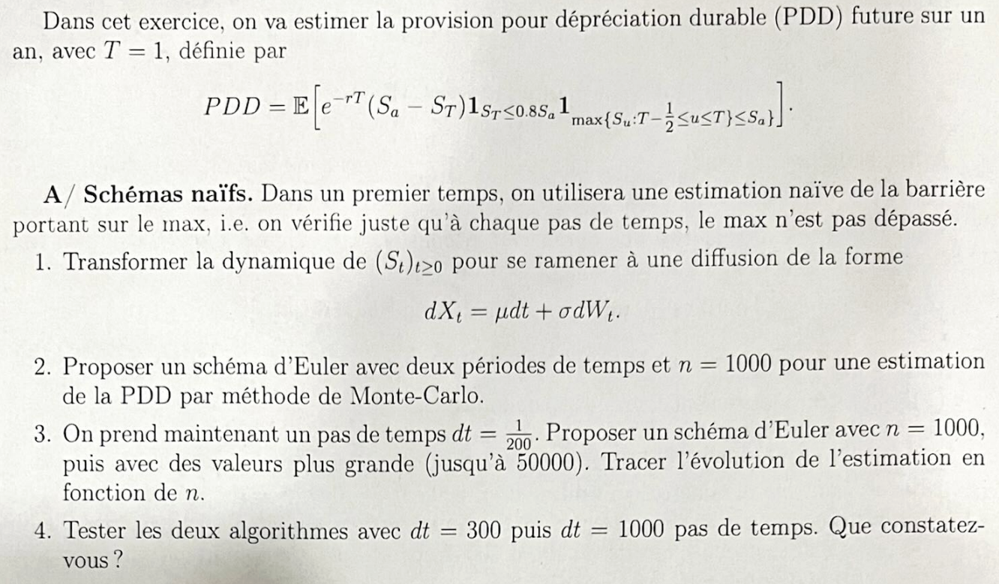

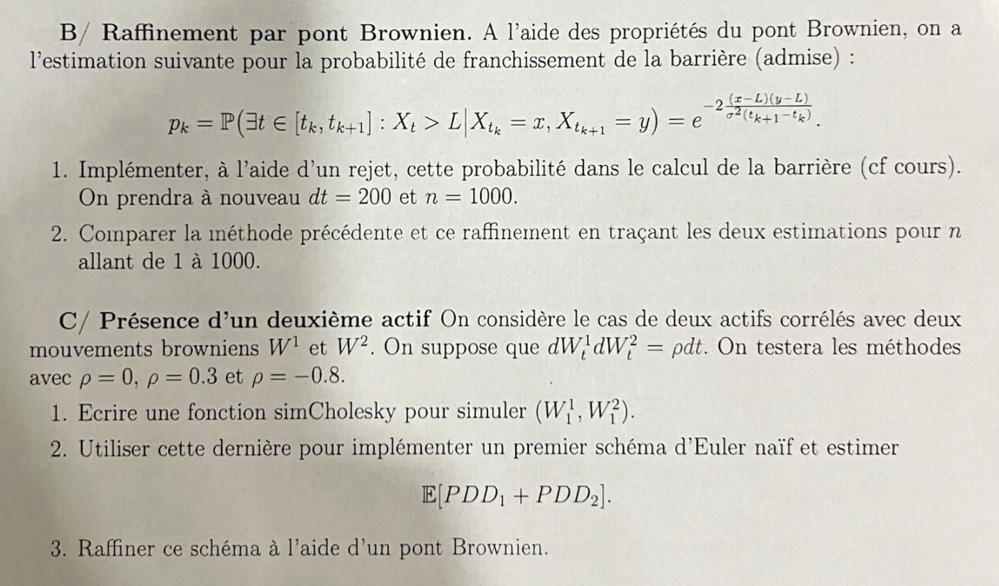

## 3.3. Life Product


### **Actuarial Notation**

- $_t{p_x}= {S_x}(t)=P(T>t|T\ge x)$
- $_t{q_x} = {F_x}(t)=P(T\le t| T\ge x)$
- $_{u|t}{q_x} = \Pr [u < {T_x} \le u + t] = {}_u{p_x} - {}_{u + t}{p_x} ={}_{u + t}{q_x} - {}_u{q_x}={}_u{p_x} \cdot {}_t{q_{x + u}}$

### **Life Table**

- ${_t}p_x=\dfrac{\text{\# survivors at age}\, x+t}{\text{\# survivors at age}\, x}=\dfrac{l_{x+t}}{l_{x}}$
- ${_t}q_x=\dfrac{\text{\# deaths between ages}\, x \, \text{and}\, x+t}{\text{\# survivors at age}\, x}=\dfrac{{_t}d_{x}}{l_{x}}=\dfrac{l_x-l_{x+t}}{l_{x}}$
- $_{u|t}{q_x}=\dfrac{\text{\# deaths between ages}\, x+u \, \text{and}\, x+u+t}{\text{\# survivors at age}\, x}=\dfrac{{_t}d_{x+u}}{l_{x}}=\dfrac{l_{x+u}-l_{x+u+t}}{l_{x}}$


In [45]:
T=1000 # Days the fund will ruin in T days
num_sim=10000
initial_capital=0
booksize=1

loc = 0.0015730127368506575
scale = 0.010766647940799455
data = stats.logistic.rvs(loc=loc, scale=scale, size=(num_sim,T))

deductible=-0.05*booksize
policy_limit=-0.07*booksize
vni=alpha.insurance_advice(deductible=deductible/booksize,policy_limit=policy_limit/booksize,administrative_cost=0.0,profit_margin=0.0)
vni_loss = vni.loss.sort_values()

incured_loss=max_(min_(pd.DataFrame(data),deductible)-deductible,policy_limit-deductible)
revenue=(initial_capital+pd.DataFrame(index=incured_loss.index,columns=incured_loss.columns).fillna(vni.insurance_premium)).cumsum(axis=1)
cum_loss = incured_loss.cumsum(axis=1)

fund_balance=revenue+cum_loss
ruin_status=if_else(fund_balance<=0,0,1).cumprod(axis=1)

----------------------------------------------
Insurance premium to pay: 0.00 VND
----------------------------------------------
----------------------------------------------
Insurance payout received: 0.00 VND
----------------------------------------------
Expected Claim Method: -0.03
Chain Ladder Method: 0.05
Bornhuetter-Ferguson Method: 0.01
Chain Ladder Method: 0.05
Benktander Method: 0.03


/var/folders/w7/3q8cywj12cd3qncp6sgxxy2c0000gn/T/ipykernel_71087/1437141201.py:16: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [46]:
ruin_status

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
1,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
3,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
4,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
9996,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
9997,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
9998,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [47]:
def cal_Tx(x):
    res = ruin_status.cumsum(axis=1).iloc[:,-1]-x
    return res[res>0] 


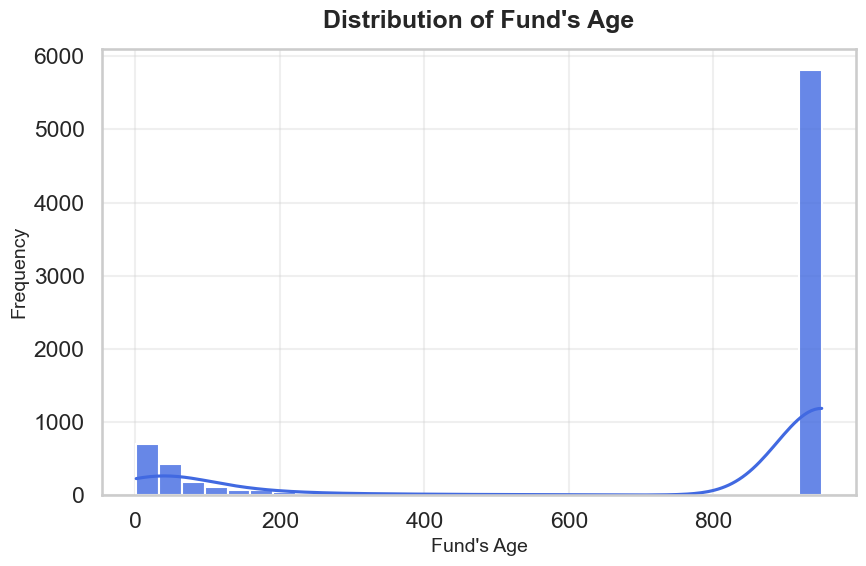

In [48]:

T_100 = cal_Tx(50)

plt.figure(figsize=(9, 6))

# Histogram with smooth KDE overlay
sns.histplot(
    T_100,
    bins=30,
    kde=True,
    color="royalblue",
    edgecolor="white",
    alpha=0.8
)

# Titles and labels
plt.title("Distribution of Fund's Age",
          fontsize=18, weight="bold", pad=15)
plt.xlabel("Fund's Age", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


In [49]:
T_0 = cal_Tx(0)
counts = T_0.value_counts()
percentages = (counts / counts.sum())
pd.DataFrame({'number_of_death': counts, 'mortality_rate': percentages}).sort_index()
number_of_survival=ruin_status.sum()
number_of_survival

0      9914
1      9828
2      9736
3      9670
4      9588
       ... 
995    5811
996    5811
997    5811
998    5811
999    5811
Length: 1000, dtype: int64

In [50]:
life_table=pd.DataFrame(number_of_survival,columns=["number_of_survival"])
life_table["number_of_death"]=abs(ts_delay(ts_delta(life_table,1),-1))
life_table["survival rate"]=ts_delay(life_table["number_of_survival"],-1)/life_table["number_of_survival"]
life_table["mortality_rate"]=life_table["number_of_death"]/life_table["number_of_survival"]
life_table["cumulative_survival_rate"] = life_table["survival rate"].cumprod()
life_table

,number_of_survival,number_of_death,survival rate,mortality_rate,cumulative_survival_rate
0,9914,86.0,0.991325,0.008675,0.991325
1,9828,92.0,0.990639,0.009361,0.982046
2,9736,66.0,0.993221,0.006779,0.975388
3,9670,82.0,0.991520,0.008480,0.967117
4,9588,72.0,0.992491,0.007509,0.959855
...,...,...,...,...,...
995,5811,0.0,1.000000,0.000000,0.586141
996,5811,0.0,1.000000,0.000000,0.586141
997,5811,0.0,1.000000,0.000000,0.586141
998,5811,0.0,1.000000,0.000000,0.586141


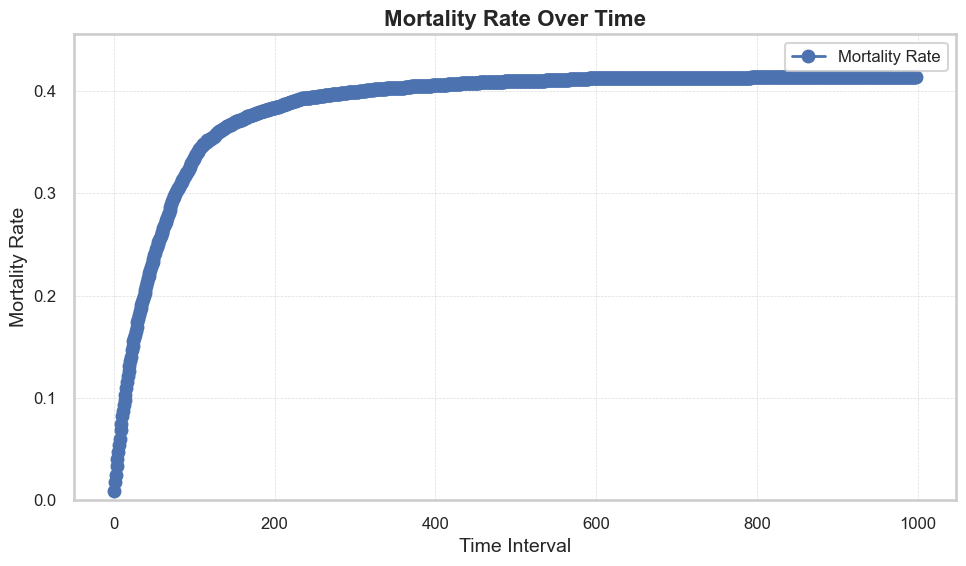

In [51]:
# Plot the mortality rate
plt.figure(figsize=(10, 6))
plt.plot(1-life_table["cumulative_survival_rate"], marker="o", linestyle="-", linewidth=2, label="Mortality Rate")

# Beautify the plot
plt.title("Mortality Rate Over Time", fontsize=16, fontweight="bold")
plt.xlabel("Time Interval", fontsize=14)
plt.ylabel("Mortality Rate", fontsize=14)
plt.grid(visible=True, linestyle="--", linewidth=0.5, alpha=0.7)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, max(1-life_table["cumulative_survival_rate"]) * 1.1)  # Adjust y-axis for better visualization
plt.legend(fontsize=12, loc="best")
plt.tight_layout()

# Show the plot
plt.show()

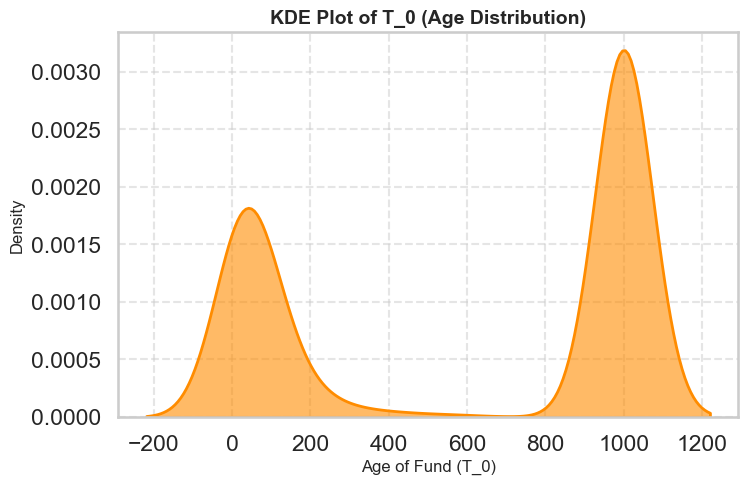

In [52]:
# Create the KDE plot
plt.figure(figsize=(8, 5))
sns.kdeplot(T_0, fill=True, color="darkorange", alpha=0.6, linewidth=2)

# Add labels and title
plt.xlabel("Age of Fund (T_0)", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.title("KDE Plot of T_0 (Age Distribution)", fontsize=14, fontweight="bold")

# Improve style
plt.grid(True, linestyle="--", alpha=0.5)

# Show the plot
plt.show()


=> 2 Main Scenarios: Good and Bad Funds

In [53]:
spot_rate=0.05
v=1/(1+spot_rate)

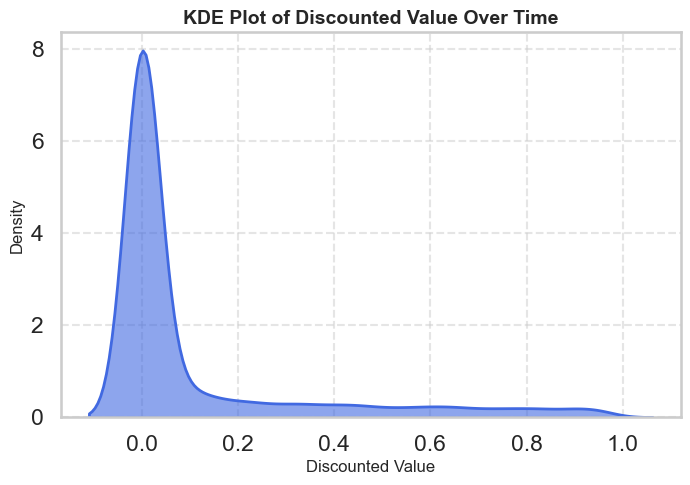

In [54]:
# Create the KDE plot
plt.figure(figsize=(8, 5))
sns.kdeplot(v**T_0, fill=True, color="royalblue", alpha=0.6, linewidth=2)

# Add labels and title
plt.xlabel("Discounted Value", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.title("KDE Plot of Discounted Value Over Time", fontsize=14, fontweight="bold")

# Improve style
plt.grid(True, linestyle="--", alpha=0.5)

# Show the plot
plt.show()


### Whole Life Insurance: A Lifetime Guarantee  

Description:  

The whole life insurance model is expressed as:  

$$
Z = v^{T_x}, \; T_x \ge 0
$$

This formula represents the present value of a guaranteed payout at any time after the insured event occurs. Whole life insurance offers lifelong coverage, ensuring that beneficiaries receive compensation regardless of when the event happens. This provides long-term financial security and peace of mind for policyholders.

In [55]:
z=v**T_0
np.mean(1e8*v)

95238095.23809524

### Term Life Insurance and Insolvency Compensation  

Description:  

The term life insurance model is defined by the equation:  

$$
Z=\begin{cases} 
v^{T_x}, & 0 \le T_x < n \\ 
0, & T_x \ge n 
\end{cases}
$$

Here, $ Z $ represents the present value of compensation, where $ v^{T_x} $ applies if the event occurs within the policy term $ n $. Specifically, the policy ensures a payout of 100 million if the company goes bankrupt within 252 days, providing financial security and assurance for stakeholders in the event of early insolvency.

In [56]:
z=v**T_0*(T_0<252)
np.mean(1e8*z)

11072621.56607852

### Deferred Whole Life Insurance: Reward for Longevity  

Description:  

The deferred whole life insurance model is represented as:  

$$
Z = \begin{cases} 
0, & 0 \le T_x < n \\ 
v^{T_x}, & T_x \ge n 
\end{cases}
$$

In this case, the policy guarantees a payout of 100 million if the company survives beyond 252 days. No compensation is provided if insolvency occurs before this period. This approach incentivizes longevity and provides financial assurance for stakeholders while aligning with the company’s stability goals.

In [57]:
z=(v**T_0)*(T_0>=252)
np.mean(1e8*z)

0.9780419714038807

### Pure Endowment: Guaranteed Payout for Longevity  

Description:  

The pure endowment model is expressed as:  

$$
Z = \begin{cases} 
0, & T_x < n \\ 
v^n, & T_x \ge n 
\end{cases}
$$

Under this policy, a payout of 100 million is guaranteed on the 252nd day if the company survives beyond 252 days. If the company does not reach this milestone, no compensation is provided. This structure ensures financial rewards for longevity, supporting the company's focus on sustained operations and stability.

In [58]:
z=v**252*(T_0>=252)
np.mean(1e8*z)

277.0516439851383

### Endowment Insurance: A Blend of Protection and Savings  

Description:

The endowment insurance model is defined as:  

$$
Z = \begin{cases} 
v^{T_x}, & T_x < n \\ 
v^n, & T_x \ge n 
\end{cases}
$$

This policy combines the features of an $ n $-year term insurance and an $ n $-year pure endowment. It provides financial coverage in case of insolvency before $ n $, paying $ v^{T_x} $, while also ensuring a guaranteed payout $ v^n $ if the company survives $ n $ years. This structure balances risk protection and savings, offering security in both short-term and long-term scenarios.

In [59]:
z=v**T_0*(T_0<252)+v**252*(T_0>=252)
np.mean(1e8*z)

11072898.617722502

### Proportional Rewards for Timing  

Description:  

The varying benefit insurance model is represented as:  

$$
Z = T_x \cdot v^{T_x}, \; T_x \ge 0
$$

This policy provides a payout proportional to both the time of the insured event, $ T_x $, and the present value factor, $ v^{T_x} $. The benefit increases with $ T_x $, rewarding longevity while accounting for the time value of money. This structure aligns payouts with the timing of the event, offering a dynamic and flexible insurance solution.

In [60]:
z=T_0*(v**T_0*(T_0>=0))
np.mean(1e8*z)

159209080.27296126

### Time-Based Proportional Payout  

Description:  

The limited varying benefit insurance model is expressed as:  

$$
Z = \begin{cases} 
T_x \cdot v^{T_x}, & 0 \leq T_x < n \\ 
0, & T_x \ge n 
\end{cases}
$$

This policy provides a payout proportional to $ T_x $ and the present value factor $ v^{T_x} $, but only if the insured event occurs within the first $ n $ years. No benefit is paid if the event occurs after $ n $. This approach limits coverage to a specific timeframe while offering proportional compensation for events occurring earlier, balancing flexibility with cost control.

In [61]:
z=T_0*(v**T_0*(T_0<252))
np.mean(1e8*z)

159208816.1119017

### Reducing Coverage Over Time  

Description:  

The decreasing benefit insurance model is defined as:  

$$
Z = \begin{cases} 
(n - T_x) \cdot v^{T_x}, & 0 \leq T_x < n \\ 
0, & T_x \ge n 
\end{cases}
$$

Under this policy, the benefit decreases linearly with time, starting from a maximum value $ n \cdot v^{T_x} $ and reducing as $ T_x $ approaches $ n $. If the insured event occurs after $ n $, no payout is made. This structure is suitable for scenarios where the need for financial protection diminishes over time, aligning coverage with decreasing liabilities or risks.

In [62]:
z=(252-T_0)*(v**T_0*(T_0<252))
np.mean(1e8*z)

2631091818.539885

### Whole Life Annuity
Let $Y$ denote the present value of annuity payments. For a whole life annuity payable continuously at the rate of $1 per year while ($x$) is alive, $Y$ is:

$$
Y = \$1\cdot \overline{a}_{\angl {$T_x$}}\;,{T_x} \ge 0
\\
Z = {v^{{T_x}}}\;,{T_x} \ge 0
\\
Y=\frac{1-Z}{\delta}
$$

In [63]:
i_365=1/v-1
delta=log(1+i_365)
z=v**T_0
y=(1-z)/delta
np.mean(1e8*y)

1822649687.0775883

### Temporary Life Annuity

Let Y denote the present value of the annuity payments. For an annuity payable continuously at the rate of $1 per year for a maximum of n years while (x) survives, Y is:

$$
Y = \begin{cases}\overline{a}_{\angl{$T_x$}} &, {T_x} < n \\ \overline{a}_{\angl{n}}& ,{T_x} \ge n\end{cases}
\\
Z = \begin{cases}v^{T_x} & , {T_x} < n \\ {v^{{n}}} & ,{T_x} \ge n\end{cases}
\\
Y=\frac{1-Z}{\delta}
$$


In [64]:
i_365=1/v-1
delta=log(1+i_365)
z=v**T_0*(T_0<252)+v**252*(T_0>=252)
y=(1-z)/delta
np.mean(1e8*y)

1822644028.6911767

### Deferred Annuity

For an annuity payable to ($x$) where continuous payments of $1 begin at age $x+n$ until the death of ($x$), the present value of the annuity payment, $Y$, is:

$$
\begin{align}Y &= \begin{cases}0 &, {T_x} < n \\ v^{n}\cdot\overline{a}_{\angl {$T_x$-n}}& ,{T_x} \ge n\end{cases}= \begin{cases}0 &, {T_x} < n \\ \overline{a}_{\angl{$T_x$}}-\overline{a}_{\angl{n}}& ,{T_x} \ge n\end{cases}\end{align}
$$

In [65]:
i_365=1/v-1
delta=log(1+i_365)
y=v**T_0*((1-v**(T_0-252))/delta)*(T_0>=252)
np.mean(1e8*y)

9.336950511824867

### Certain-and-Life Annuity

The present value of a continuous annuity of $1 per year on ($x$) with payments guaranteed for a period of $n$ years is:

$$
Y = \begin{cases}\overline{a}_{\angl {n}} &, {T_x} < n \\ \overline{a}_{\angl {$T_x$}}& ,{T_x} \ge n\end{cases}
$$

In [66]:
i_365=1/v-1
delta=log(1+i_365)
y=((1-v**252)/delta)*(T_0<252)+((1-v**T_0)/delta)*(T_0>=252)
np.mean(1e8*y)

2049589714.9646082

### Premium and policy value calculation for long-term insurance coverages

**Net Future Loss**

- $_0L$ is the ***net future loss at issue***:
    
    $$
    _0L = PV(\text{Future Benefits}) - PV(\text{Future Premiums})
    $$
    
- Using the Equivalence Principle, set $E[_0L]=0$.
    
    $$
    EPV_0(\text{Future Benefits}) = EPV_0(\text{Future Premiums})
    $$

Fully Continuous Whole Life Insurance


$$
\begin{align}{_0}L &= {bv^{{T_x}}} - P{\overline a _{\angl {$T_x$}}}\\&= \left( {b + {P \over \delta }} \right){v^{{T_x}}} - {P \over \delta }\end{align}
$$

In [67]:
i_365=1/v-1
delta=log(1+i_365)
b=1e8
P=np.mean(b*v**T_0)/np.mean((1-v**T_0)/delta)
P

607501.4097675664

Fully Continuous Endowment Insurance
$$
\begin{aligned}{_0}L &= {bv^{\min({T_x},n)}} - P{\overline a _{\angl{$\min({T_x},n)$}}}\\&=\left(b+\dfrac{P}{\delta}\right){v^{\min({T_x},n)}} - \dfrac{P}{\delta}\end{aligned}
$$

In [68]:
i_365=1/v-1
delta=log(1+i_365)
b=1e8
P=np.mean(b*v**min_(T_0,252))/np.mean((1-v**min_(T_0,252))/delta)
P

607518.4426261145

**Net Premium Policy Value (a.k.a. Net Premium Reserve)**

$_tV$ denotes the expected net future loss $t$ years after the policy issue date, assuming the policy is still in force at that time.

- Under the **prospective method**:
    
    $$
    _tV = E[_tL] = EPV_t[\text{Future Benefits}] - EPV_t[\text{Future Premiums}]
    $$
    
    - For example, for a fully discrete whole life insurance of 1 on $(x)$:
        
        $$
        _tV = A_{x+t} - P\,\ddot a_{x+t}
        $$

## 3.4. Survival analysis

In [69]:
_tmp=T_0.value_counts().sort_index().reset_index().values
res=[]
for i,j in _tmp:
    res.extend([i]*j)

# Adjusted dataset: multiple events on the same day
data = pd.DataFrame({
    'day': res,  # Duplicate days (e.g., 1, 3)
    'ruin': [1]*len(res)  # 1 = event, 0 = censored
})


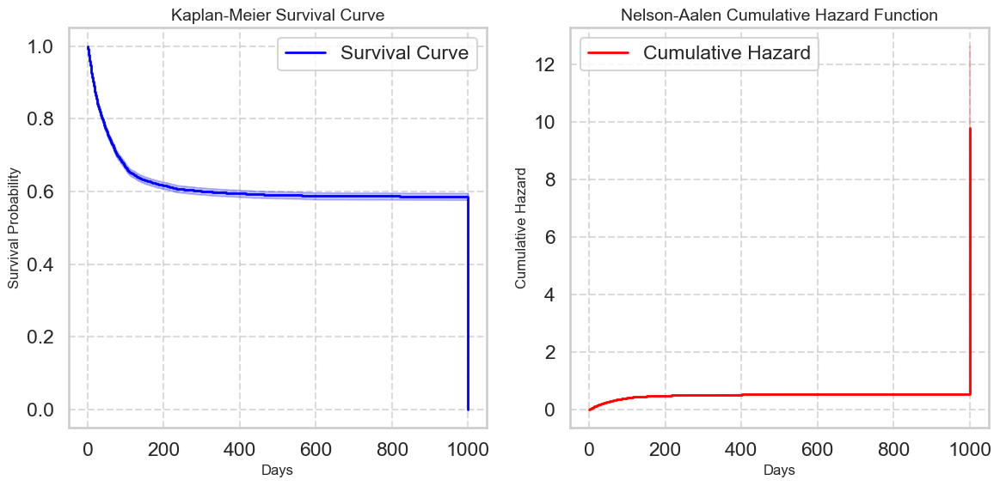

In [70]:
from lifelines import KaplanMeierFitter, NelsonAalenFitter

# Kaplan-Meier Survival Analysis
kmf = KaplanMeierFitter()
kmf.fit(durations=data['day'], event_observed=data['ruin'], label="Survival Curve")

# Nelson-Aalen Cumulative Hazard Analysis
naf = NelsonAalenFitter()
naf.fit(durations=data['day'], event_observed=data['ruin'], label="Cumulative Hazard")

# Plot both analyses
plt.figure(figsize=(12, 6))

# Plot Kaplan-Meier survival curve
plt.subplot(1, 2, 1)
kmf.plot(ci_show=True, color="blue", linewidth=2)
plt.title("Kaplan-Meier Survival Curve", fontsize=14)
plt.xlabel("Days", fontsize=12)
plt.ylabel("Survival Probability", fontsize=12)
plt.grid(visible=True, linestyle="--", alpha=0.7)

# Plot Nelson-Aalen cumulative hazard function
plt.subplot(1, 2, 2)
naf.plot(ci_show=True, color="red", linewidth=2)
plt.title("Nelson-Aalen Cumulative Hazard Function", fontsize=14)
plt.xlabel("Days", fontsize=12)
plt.ylabel("Cumulative Hazard", fontsize=12)
plt.grid(visible=True, linestyle="--", alpha=0.7)

# Adjust layout and show plots
plt.tight_layout()
plt.show()
